# Loan Approval Prediction

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")
import warnings
warnings.filterwarnings('ignore')

# Data Loading

In [2]:
df = pd.read_csv('loan approval dataset.csv')
df.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


# Data Exploration

In [3]:
df.shape

(45000, 14)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_age                      45000 non-null  float64
 1   person_gender                   45000 non-null  object 
 2   person_education                45000 non-null  object 
 3   person_income                   45000 non-null  float64
 4   person_emp_exp                  45000 non-null  int64  
 5   person_home_ownership           45000 non-null  object 
 6   loan_amnt                       45000 non-null  float64
 7   loan_intent                     45000 non-null  object 
 8   loan_int_rate                   45000 non-null  float64
 9   loan_percent_income             45000 non-null  float64
 10  cb_person_cred_hist_length      45000 non-null  float64
 11  credit_score                    45000 non-null  int64  
 12  previous_loan_defaults_on_file  

In [5]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
person_age,45000.000000,27.764178,6.045108,20.000000,24.000000,26.000000,30.000000,144.000000
person_income,45000.000000,80319.053222,80422.498632,8000.000000,47204.000000,67048.000000,95789.250000,7200766.000000
person_emp_exp,45000.000000,5.410333,6.063532,0.000000,1.000000,4.000000,8.000000,125.000000
loan_amnt,45000.000000,9583.157556,6314.886691,500.000000,5000.000000,8000.000000,12237.250000,35000.000000
loan_int_rate,45000.000000,11.006606,2.978808,5.420000,8.590000,11.010000,12.990000,20.000000
loan_percent_income,45000.000000,0.139725,0.087212,0.000000,0.070000,0.120000,0.190000,0.660000
cb_person_cred_hist_length,45000.000000,5.867489,3.879702,2.000000,3.000000,4.000000,8.000000,30.000000
credit_score,45000.000000,632.608756,50.435865,390.000000,601.000000,640.000000,670.000000,850.000000
loan_status,45000.000000,0.222222,0.415744,0.000000,0.000000,0.000000,0.000000,1.000000


# Data Cleaning & Preprocessing

In [6]:
df.duplicated().sum()

0

In [7]:
summary_info = pd.DataFrame({'Dtypes': df.dtypes, 'Nuique': df.nunique(), 'Null_Ratio': round(df.isnull().sum() / len(df) * 1000,2)})
summary_info

,Dtypes,Nuique,Null_Ratio
person_age,float64,60,0.0
person_gender,object,2,0.0
person_education,object,5,0.0
person_income,float64,33989,0.0
person_emp_exp,int64,63,0.0
person_home_ownership,object,4,0.0
loan_amnt,float64,4483,0.0
loan_intent,object,6,0.0
loan_int_rate,float64,1302,0.0
loan_percent_income,float64,64,0.0


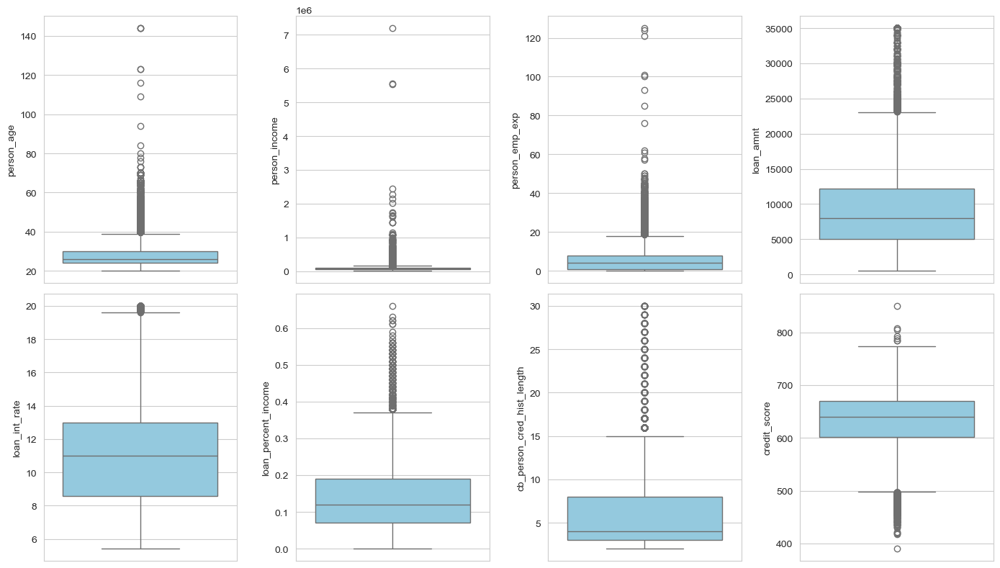

In [8]:
# check outliers
numeric_cols = df.drop('loan_status',axis=1).select_dtypes(include=np.number).columns
plt.figure(figsize=(14,8))
for i,col in enumerate(numeric_cols):
    plt.subplot(2,4,i+1)
    sns.boxplot(data=df,y=col,color='skyblue')
plt.tight_layout()
plt.show()

In [9]:
# Standardize text formatting
object_cols = df.select_dtypes(include='object')
for col in object_cols:
    df[col] = df[col].str.title()

In [10]:
# check outliers in object columns
df['person_home_ownership'].value_counts()

person_home_ownership
Rent        23443
Mortgage    18489
Own          2951
Other         117
Name: count, dtype: int64

In [11]:
# Handle categorical value inconsistencies
df = df.replace({'person_home_ownership': {'Other': 'Rent'}})

In [12]:
# Feature Engineering: Creating new features based on domain knowledge
df['income_emp_ratio'] = df['person_income'] / (df['person_emp_exp'] + 1)
df['emp_stability'] = df['person_emp_exp'] / (df['person_age'] + 1)

In [13]:
### feature show how related age by loan amount
df['age_loan_ratio'] = df['person_age'] / (df['loan_amnt'] + 1)
df['income_loan_ratio'] = df['person_income'] / (df['loan_amnt'] + 1)

In [14]:
age_bins = [18, 25, 35, 50, 65]
age_labels = ['18-25', '26-35', '36-50', '51-65']
df['age_group'] = pd.cut(df['person_age'], bins=age_bins, labels=age_labels)

In [15]:
df['credit_score_group'] = pd.cut(df['credit_score'], bins=[0, 580, 670, 740, 800, 850], 
                                labels=['Poor', 'Fair', 'Good', 'Very Good', 'Excellent'])

In [16]:
df['loan_risk_category'] = pd.cut(df['loan_int_rate'], bins=[0, 10, 15, 20], 
                                    labels=['Low Risk', 'Medium Risk', 'High Risk'])

In [17]:
income_bins = [0, 30000, 60000, 90000, 120000, float('inf')]
income_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
df['income_group'] = pd.cut(df['person_income'], bins=income_bins, labels=income_labels)

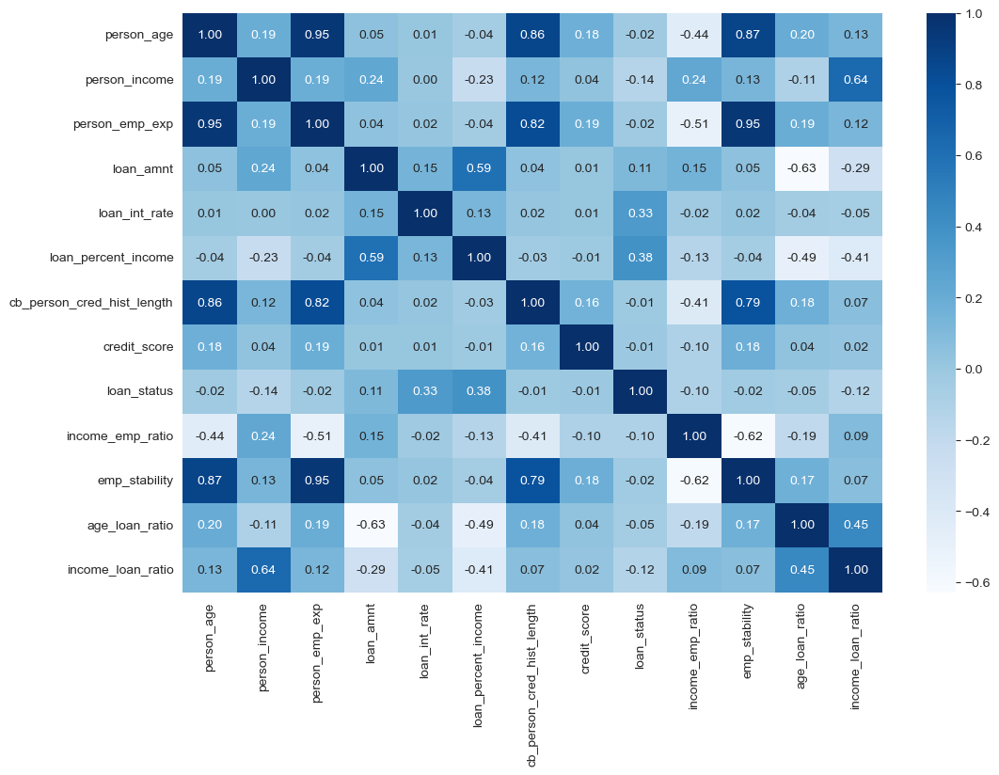

In [18]:
# show correlations between the features
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(numeric_only=True),annot=True,fmt='.2f',cmap='Blues')
plt.show()

In [19]:
# drop irrelevant features
df.drop(columns=['person_emp_exp'],axis=1,inplace=True)

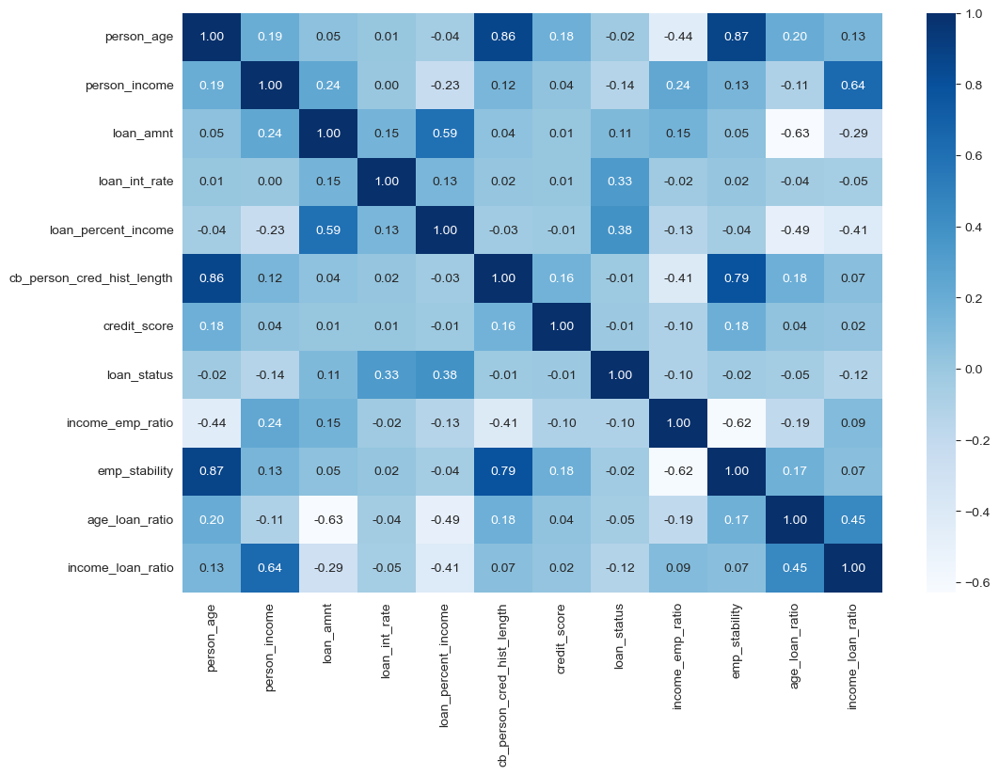

In [20]:
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(numeric_only=True),annot=True,fmt='.2f',cmap='Blues')
plt.show()

In [21]:
df

,person_age,person_gender,person_education,person_income,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,...,previous_loan_defaults_on_file,loan_status,income_emp_ratio,emp_stability,age_loan_ratio,income_loan_ratio,age_group,credit_score_group,loan_risk_category,income_group
0,22.0,Female,Master,71948.0,Rent,35000.0,Personal,16.02,0.49,3.0,...,No,1,71948.000000,0.000000,0.000629,2.055598,18-25,Poor,High Risk,Medium
1,21.0,Female,High School,12282.0,Own,1000.0,Education,11.14,0.08,2.0,...,Yes,0,12282.000000,0.000000,0.020979,12.269730,18-25,Poor,Medium Risk,Very Low
2,25.0,Female,High School,12438.0,Mortgage,5500.0,Medical,12.87,0.44,3.0,...,No,1,3109.500000,0.115385,0.004545,2.261043,18-25,Fair,Medium Risk,Very Low
3,23.0,Female,Bachelor,79753.0,Rent,35000.0,Medical,15.23,0.44,2.0,...,No,1,79753.000000,0.000000,0.000657,2.278592,18-25,Good,High Risk,Medium
4,24.0,Male,Master,66135.0,Rent,35000.0,Medical,14.27,0.53,4.0,...,No,1,33067.500000,0.040000,0.000686,1.889517,18-25,Fair,Medium Risk,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,27.0,Male,Associate,47971.0,Rent,15000.0,Medical,15.66,0.31,3.0,...,No,1,6853.000000,0.214286,0.001800,3.197853,26-35,Fair,High Risk,Low
44996,37.0,Female,Associate,65800.0,Rent,9000.0,Homeimprovement,14.07,0.14,11.0,...,No,1,3655.555556,0.447368,0.004111,7.310299,36-50,Fair,Medium Risk,Medium
44997,33.0,Male,Associate,56942.0,Rent,2771.0,Debtconsolidation,10.02,0.05,10.0,...,No,1,7117.750000,0.205882,0.011905,20.541847,26-35,Fair,Medium Risk,Low
44998,29.0,Male,Bachelor,33164.0,Rent,12000.0,Education,13.23,0.36,6.0,...,No,1,6632.800000,0.133333,0.002416,2.763436,26-35,Fair,Medium Risk,Low


In [24]:
### calulate chisqaure between categorical features and target
from scipy.stats import chi2_contingency
categorical_cols = df.select_dtypes(include=['object','category']).columns
for col in categorical_cols:
    contingency_table = pd.crosstab(df[col], df['loan_status'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-square test for {col}: p-value = {p}")
    if p < 0.05:
        print(f"{col} is significantly associated with loan_status \n")
    else:
        print(f"{col} is NOT significantly associated with loan_status\n")    

Chi-square test for person_gender: p-value = 0.9142540404277906
person_gender is NOT significantly associated with loan_status

Chi-square test for person_education: p-value = 0.732826935503778
person_education is NOT significantly associated with loan_status

Chi-square test for person_home_ownership: p-value = 0.0
person_home_ownership is significantly associated with loan_status 

Chi-square test for loan_intent: p-value = 2.173084187054017e-194
loan_intent is significantly associated with loan_status 

Chi-square test for previous_loan_defaults_on_file: p-value = 0.0
previous_loan_defaults_on_file is significantly associated with loan_status 

Chi-square test for age_group: p-value = 7.877207690639982e-08
age_group is significantly associated with loan_status 

Chi-square test for credit_score_group: p-value = 0.39293460995334084
credit_score_group is NOT significantly associated with loan_status

Chi-square test for loan_risk_category: p-value = 0.0
loan_risk_category is significa

In [28]:
## Anova test for numerical features
from scipy.stats import f_oneway
numerical_cols = df.select_dtypes(include=np.number).columns.drop('loan_status')
for col in numerical_cols:
    groups = [df[df['loan_status'] == status][col] for status in df['loan_status'].unique()]
    f_stat, p_value = f_oneway(*groups)
    print(f"ANOVA test for {col}: p-value = {p_value}")
    if p_value < 0.05:
        print(f"{col} is significantly associated with loan_status")
    else:
        print(f"{col} is NOT significantly associated with loan_status")

ANOVA test for person_age: p-value = 5.20977352158707e-06
person_age is significantly associated with loan_status
ANOVA test for person_income: p-value = 3.4830994168384627e-184
person_income is significantly associated with loan_status
ANOVA test for loan_amnt: p-value = 3.2367044161734087e-116
loan_amnt is significantly associated with loan_status
ANOVA test for loan_int_rate: p-value = 0.0
loan_int_rate is significantly associated with loan_status
ANOVA test for loan_percent_income: p-value = 0.0
loan_percent_income is significantly associated with loan_status
ANOVA test for cb_person_cred_hist_length: p-value = 0.0016305156276971596
cb_person_cred_hist_length is significantly associated with loan_status
ANOVA test for credit_score: p-value = 0.1047627305070617
credit_score is NOT significantly associated with loan_status
ANOVA test for income_emp_ratio: p-value = 2.1296679615113927e-105
income_emp_ratio is significantly associated with loan_status
ANOVA test for emp_stability: p-va

# Data Visulaization

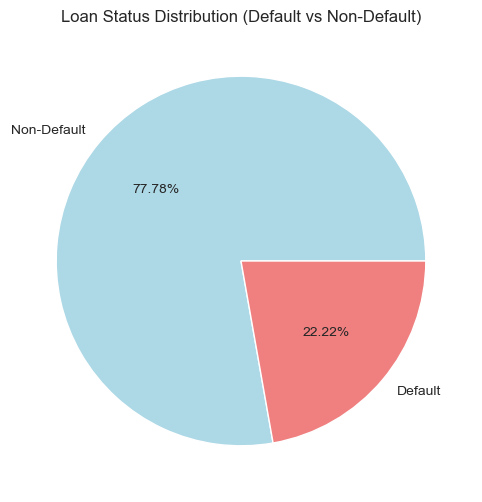

In [29]:
# Target variable distribution
plt.figure(figsize=(8, 6))
loan_status_counts = df['loan_status'].value_counts()
plt.pie(loan_status_counts, labels=['Non-Default', 'Default'], autopct='%1.2f%%', 
        colors=['lightblue', 'lightcoral'])
plt.title('Loan Status Distribution (Default vs Non-Default)')
plt.show()

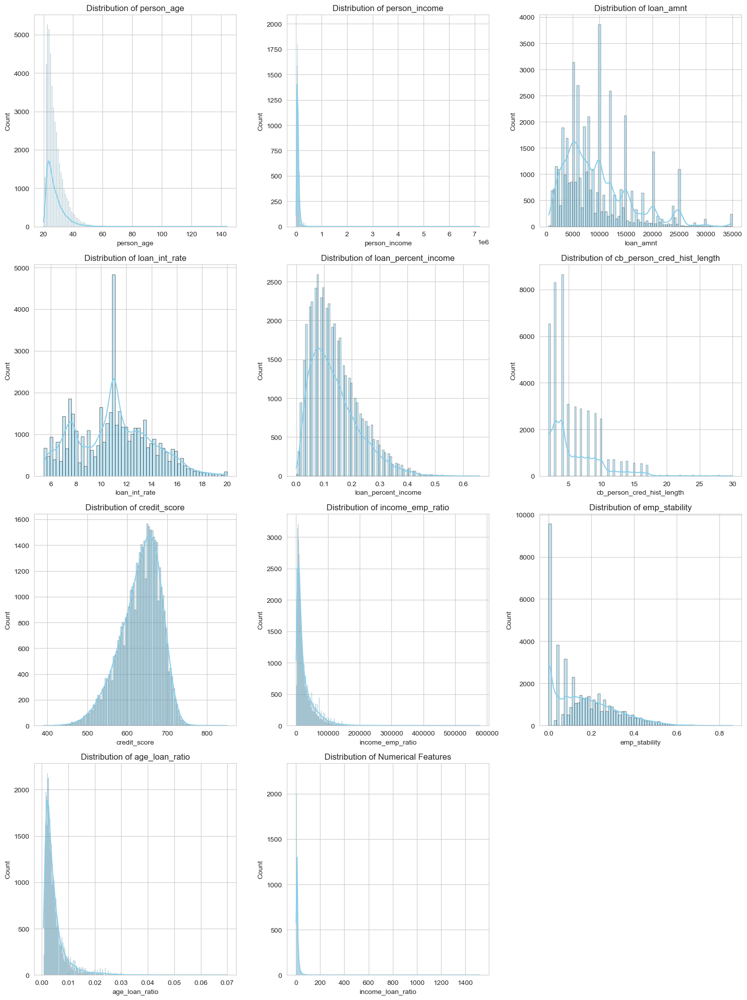

In [30]:
# Numerical features distribution
numeric_cols = df.drop('loan_status',axis=1).select_dtypes(include=np.number).columns
n_numeric = len(numeric_cols)
n_cols = 3
n_rows = (n_numeric + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='skyblue', edgecolor="black")
    axes[i].set_title(f'Distribution of {col}')

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.title("Distribution of Numerical Features")
plt.tight_layout()
plt.show()

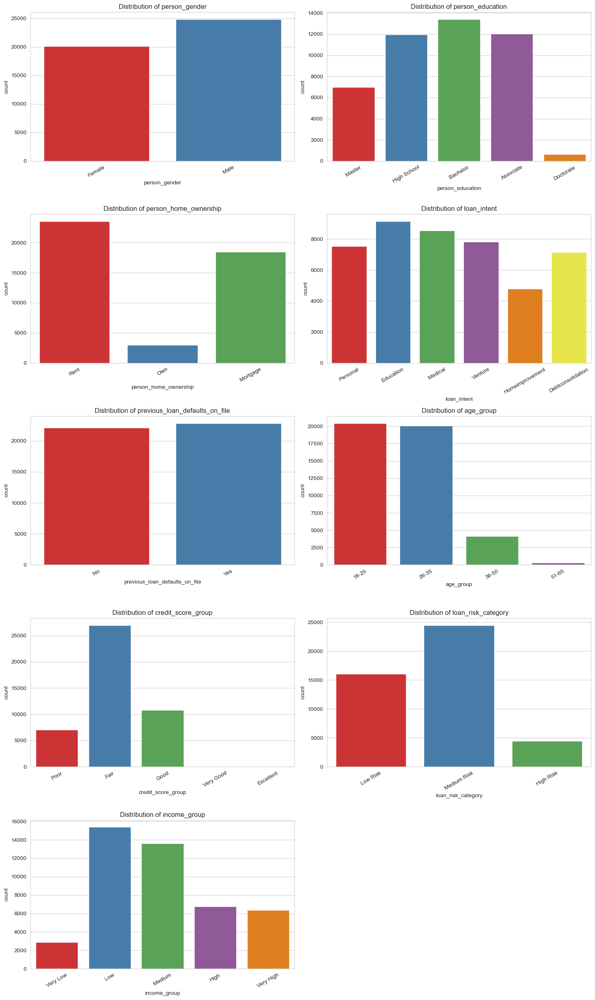

In [31]:
# Distribution for Categorical Features
cat_cols = df.select_dtypes(include=['object','category']).columns
n_cat = len(cat_cols)
n_cols = 2
n_rows = (n_cat + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.countplot(x=col, data=df, palette="Set1", ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")
    axes[i].tick_params(axis="x", rotation=30)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

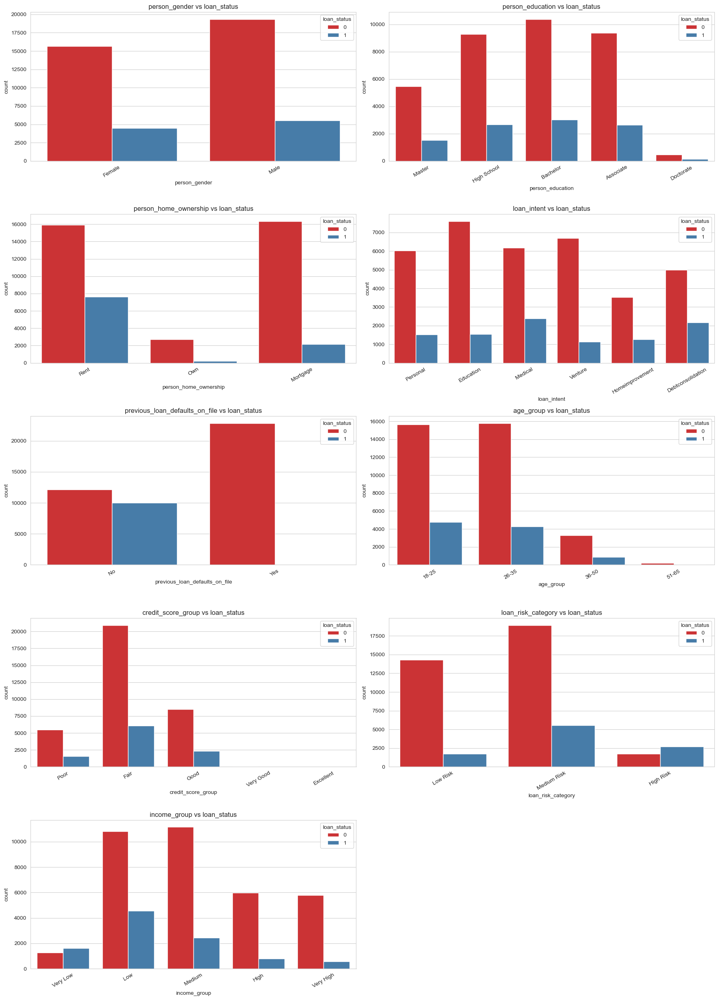

In [35]:
# Relationship between categorical features and target variable
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.countplot(x=col, hue="loan_status", data=df, palette="Set1", ax=axes[i])
    axes[i].set_title(f"{col} vs loan_status")
    axes[i].tick_params(axis="x", rotation=30)

for j in range(len(cat_cols), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

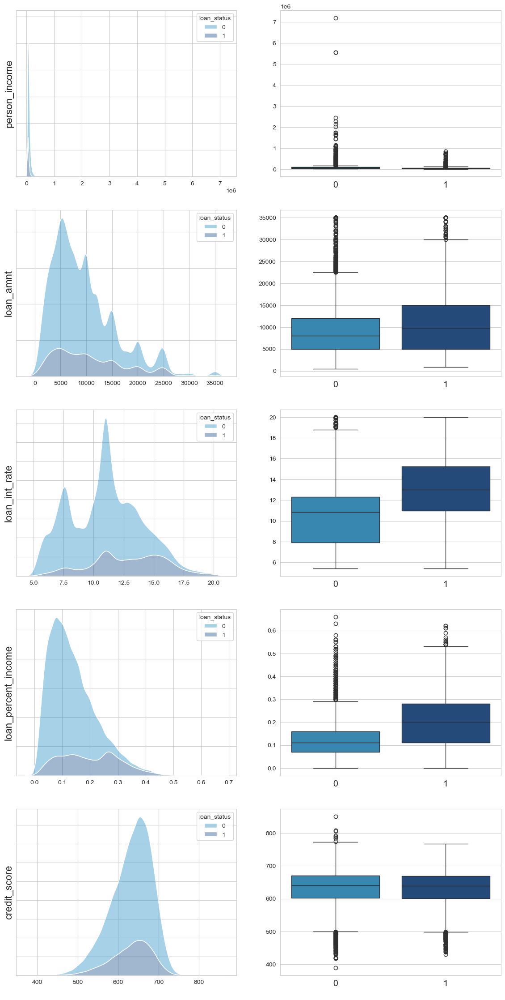

In [36]:
important_numeric = ['person_income', 'loan_amnt', 'loan_int_rate', 
                        'loan_percent_income', 'credit_score']

fig, ax = plt.subplots(ncols=2, nrows=5, figsize=(14, 28))

i=0
for cols in important_numeric:
    sns.kdeplot(x=df[cols], fill=True, alpha=0.4, hue =df.loan_status, 
                palette=('#248DC5', "#154989"), multiple='stack', ax=ax[i,0])
    
    sns.boxplot(data= df, y=cols, x='loan_status', ax=ax[i, 1],
               palette=('#248DC5', '#154989'))
    ax[i,0].set_xlabel(' ')
    ax[i,1].set_xlabel(' ')
    ax[i,1].set_ylabel(' ')
    ax[i,1].xaxis.set_tick_params(labelsize=14)
    ax[i,0].tick_params(left=False, labelleft=False)
    ax[i,0].set_ylabel(cols, fontsize=16)
    i=i+1
      
plt.show()

# Additional Analysis and Insights Generation

In [53]:
# Analysis by gender
import plotly.graph_objects as go
from plotly.subplots import make_subplots
gender_analysis = df.groupby('person_gender')['loan_status'].agg(['count', 'mean'])
gender_analysis.columns = ['Total_Loans', 'Default_Rate']
gender_analysis['Default_Rate'] = round(gender_analysis['Default_Rate'] * 100,2)

In [55]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Default Rate by Gender', 'Total Loans by Gender', 
                   'Default Rate vs Total Loans', 'Loan Distribution by Gender'),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "pie"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# Color scheme for genders
gender_colors = {
    'Male': '#1f77b4',      # Blue
    'Female': '#ff7f0e',    # Orange
}

# Get colors for each gender
colors = [gender_colors.get(gender, '#d62728') for gender in gender_analysis.index]

# 1. Default Rate Bar Chart
fig.add_trace(
    go.Bar(
        x=gender_analysis.index,
        y=gender_analysis['Default_Rate'],
        name='Default Rate',
        marker_color=colors,
        text=gender_analysis['Default_Rate'],
        texttemplate='%{text:.1f}%',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray')
    ),
    row=1, col=1
)

# 2. Total Loans Bar Chart
fig.add_trace(
    go.Bar(
        x=gender_analysis.index,
        y=gender_analysis['Total_Loans'],
        name='Total Loans',
        marker_color=colors,
        text=gender_analysis['Total_Loans'],
        texttemplate='%{text:,}',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray')
    ),
    row=1, col=2
)

# 3. Scatter Plot: Default Rate vs Total Loans
fig.add_trace(
    go.Scatter(
        x=gender_analysis['Total_Loans'],
        y=gender_analysis['Default_Rate'],
        mode='markers+text',
        marker=dict(
            size=gender_analysis['Default_Rate'] * 3,
            color=colors,
            line=dict(width=2, color='darkgray')
        ),
        text=gender_analysis.index,
        textposition='middle right',
        name='Risk vs Volume',
    ),
    row=2, col=1
)

# 4. Pie Chart: Loan Distribution
fig.add_trace(
    go.Pie(
        labels=gender_analysis.index,
        values=gender_analysis['Total_Loans'],
        name='Loan Distribution',
        hole=0.4,
        marker=dict(colors=colors),
        textinfo='percent+label',
        hoverinfo='label+value+percent',
        hovertemplate='<b>%{label}</b><br>Loans: %{value:,}<br>Percentage: %{percent}<extra></extra>'
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='Comprehensive Gender Analysis - Loan Performance',
    title_x=0.5,
    title_font=dict(size=20),
    height=800,
    width=1000,
    showlegend=False,
    plot_bgcolor='white',
    font=dict(size=12),
    annotations=[
        dict(
            text=f"Overall Default Rate: {gender_analysis['Default_Rate'].mean():.1f}%",
            x=0.5,
            y=1.05,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=14, color='darkred')
        )
    ]
)

# Update axes labels
fig.update_xaxes(title_text="Gender", row=1, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Gender", row=1, col=2)
fig.update_yaxes(title_text="Number of Loans", row=1, col=2)
fig.update_xaxes(title_text="Total Loans", row=2, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=2, col=1)

# Show the plot
fig.show()

In [52]:
# Analysis by education level
education_analysis = df.groupby('person_education')['loan_status'].agg(['count', 'mean']).sort_values('mean', ascending=False)
education_analysis.columns = ['Total_Loans', 'Default_Rate']
education_analysis['Default_Rate'] = round(education_analysis['Default_Rate'] * 100,2)

In [ ]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Default Rate by Education Level', 'Total Loans by Education Level', 
                   'Default Rate vs Total Loans', 'Loan Distribution by Education'),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "pie"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# 1. Default Rate Bar Chart
fig.add_trace(
    go.Bar(
        x=education_analysis.index,
        y=education_analysis['Default_Rate'],
        name='Default Rate',
        marker_color=education_analysis['Default_Rate'],
        marker_colorscale='RdYlGn_r',
        text=education_analysis['Default_Rate'],
        texttemplate='%{text:.1f}%',
        textposition='auto'
    ),
    row=1, col=1
)

# 2. Total Loans Bar Chart
fig.add_trace(
    go.Bar(
        x=education_analysis.index,
        y=education_analysis['Total_Loans'],
        name='Total Loans',
        marker_color='lightblue',
        text=education_analysis['Total_Loans'],
        texttemplate='%{text:,}',
        textposition='auto'
    ),
    row=1, col=2
)

# 3. Scatter Plot: Default Rate vs Total Loans
fig.add_trace(
    go.Scatter(
        x=education_analysis['Total_Loans'],
        y=education_analysis['Default_Rate'],
        mode='markers+text',
        marker=dict(
            size=education_analysis['Default_Rate']*2,
            color=education_analysis['Default_Rate'],
            colorscale='RdYlGn_r',
            showscale=True,
            colorbar=dict(title="Default Rate %")
        ),
        text=education_analysis.index,
        textposition='middle right',
        name='Risk vs Volume'
    ),
    row=2, col=1
)

# 4. Pie Chart: Loan Distribution
fig.add_trace(
    go.Pie(
        labels=education_analysis.index,
        values=education_analysis['Total_Loans'],
        name='Loan Distribution',
        hole=0.4,
        textinfo='percent+label',
        hoverinfo='label+value+percent'
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='Comprehensive Education Level Analysis',
    title_x=0.5,
    height=800,
    width=1000,
    showlegend=False,
    plot_bgcolor='white',
    font=dict(size=12)
)

# Update axes labels
fig.update_xaxes(title_text="Education Level", row=1, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Education Level", row=1, col=2)
fig.update_yaxes(title_text="Number of Loans", row=1, col=2)
fig.update_xaxes(title_text="Total Loans", row=2, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=2, col=1)

# Show the plot
fig.show()

In [56]:
# Analysis by home ownership
home_analysis = df.groupby('person_home_ownership')['loan_status'].agg(['count', 'mean']).sort_values('mean', ascending=False)
home_analysis.columns = ['Total_Loans', 'Default_Rate']
home_analysis['Default_Rate'] = round(home_analysis['Default_Rate'] * 100,2)

In [57]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Default Rate by Home Ownership', 'Total Loans by Home Ownership', 
                   'Risk vs Volume Analysis', 'Loan Distribution by Home Ownership'),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "pie"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# Color scheme for home ownership types
ownership_colors = {
    'Mortgage': '#1f77b4',    # Blue - typically most stable
    'Own': '#2ca02c',         # Green - fully owned
    'Rent': '#ff7f0e',        # Orange - renting
}

# Get colors for each ownership type
colors = [ownership_colors.get(ownership, '#9467bd') for ownership in home_analysis.index]

# 1. Default Rate Bar Chart (sorted by risk)
fig.add_trace(
    go.Bar(
        x=home_analysis.index,
        y=home_analysis['Default_Rate'],
        name='Default Rate',
        marker_color=colors,
        text=home_analysis['Default_Rate'],
        texttemplate='%{text:.1f}%',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x}</b><br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=1, col=1
)

# 2. Total Loans Bar Chart
fig.add_trace(
    go.Bar(
        x=home_analysis.index,
        y=home_analysis['Total_Loans'],
        name='Total Loans',
        marker_color=colors,
        text=home_analysis['Total_Loans'],
        texttemplate='%{text:,}',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x}</b><br>Total Loans: %{y:,}<extra></extra>'
    ),
    row=1, col=2
)

# 3. Scatter Plot: Default Rate vs Total Loans (Bubble Chart)
fig.add_trace(
    go.Scatter(
        x=home_analysis['Total_Loans'],
        y=home_analysis['Default_Rate'],
        mode='markers+text',
        marker=dict(
            size=home_analysis['Default_Rate'] * 4,  # Size by default rate
            color=colors,
            line=dict(width=2, color='darkgray'),
            opacity=0.8
        ),
        text=home_analysis.index,
        textposition='middle right',
        name='Risk vs Volume',
        hovertemplate='<b>%{text}</b><br>Total Loans: %{x:,}<br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=2, col=1
)

# 4. Pie Chart: Loan Distribution
fig.add_trace(
    go.Pie(
        labels=home_analysis.index,
        values=home_analysis['Total_Loans'],
        name='Loan Distribution',
        hole=0.4,
        marker=dict(colors=colors),
        textinfo='percent+label',
        hoverinfo='label+value+percent',
        hovertemplate='<b>%{label}</b><br>Loans: %{value:,}<br>Percentage: %{percent}<extra></extra>',
        pull=[0.1 if rate == home_analysis['Default_Rate'].max() else 0 for rate in home_analysis['Default_Rate']]
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='Comprehensive Home Ownership Analysis - Loan Performance',
    title_x=0.5,
    title_font=dict(size=20),
    height=800,
    width=1000,
    showlegend=False,
    plot_bgcolor='white',
    font=dict(size=12),
    annotations=[
        dict(
            text=f"Overall Default Rate: {home_analysis['Default_Rate'].mean():.1f}%",
            x=0.5,
            y=1.05,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=14, color='darkred')
        )
    ]
)

# Update axes labels
fig.update_xaxes(title_text="Home Ownership Type", row=1, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Home Ownership Type", row=1, col=2)
fig.update_yaxes(title_text="Number of Loans", row=1, col=2)
fig.update_xaxes(title_text="Total Loans", row=2, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=2, col=1)

# Show the plot
fig.show()


In [58]:
# Analysis by loan purpose
intent_analysis = df.groupby('loan_intent')['loan_status'].agg(['count', 'mean']).sort_values('mean', ascending=False)
intent_analysis.columns = ['Total_Loans', 'Default_Rate']
intent_analysis['Default_Rate'] = round(intent_analysis['Default_Rate'] * 100,2)

In [59]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Default Rate by Loan Purpose', 'Total Loans by Loan Purpose', 
                   'Risk vs Volume Analysis', 'Loan Distribution by Purpose'),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "pie"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# Color scheme for loan purposes (risk-based coloring)
intent_colors = {
    'Debt Consolidation': '#d62728',    # Red - typically higher risk
    'Personal': '#ff7f0e',              # Orange
    'Medical': '#9467bd',               # Purple
    'Venture': '#2ca02c',               # Green - typically lower risk
    'Education': '#1f77b4',             # Blue
    'Home Improvement': '#8c564b'       # Brown
}

# Get colors for each loan purpose
colors = [intent_colors.get(intent, '#17becf') for intent in intent_analysis.index]

# 1. Default Rate Bar Chart (sorted by risk)
fig.add_trace(
    go.Bar(
        x=intent_analysis.index,
        y=intent_analysis['Default_Rate'],
        name='Default Rate',
        marker_color=colors,
        text=intent_analysis['Default_Rate'],
        texttemplate='%{text:.1f}%',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x}</b><br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=1, col=1
)

# 2. Total Loans Bar Chart
fig.add_trace(
    go.Bar(
        x=intent_analysis.index,
        y=intent_analysis['Total_Loans'],
        name='Total Loans',
        marker_color=colors,
        text=intent_analysis['Total_Loans'],
        texttemplate='%{text:,}',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x}</b><br>Total Loans: %{y:,}<extra></extra>'
    ),
    row=1, col=2
)

# 3. Scatter Plot: Default Rate vs Total Loans (Bubble Chart)
fig.add_trace(
    go.Scatter(
        x=intent_analysis['Total_Loans'],
        y=intent_analysis['Default_Rate'],
        mode='markers+text',
        marker=dict(
            size=intent_analysis['Default_Rate'] * 4,  # Size by default rate
            color=colors,
            line=dict(width=2, color='darkgray'),
            opacity=0.8
        ),
        text=intent_analysis.index,
        textposition='middle right',
        name='Risk vs Volume',
        hovertemplate='<b>%{text}</b><br>Total Loans: %{x:,}<br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=2, col=1
)

# 4. Pie Chart: Loan Distribution
fig.add_trace(
    go.Pie(
        labels=intent_analysis.index,
        values=intent_analysis['Total_Loans'],
        name='Loan Distribution',
        hole=0.4,
        marker=dict(colors=colors),
        textinfo='percent+label',
        hoverinfo='label+value+percent',
        hovertemplate='<b>%{label}</b><br>Loans: %{value:,}<br>Percentage: %{percent}<extra></extra>',
        pull=[0.1 if rate == intent_analysis['Default_Rate'].max() else 0 for rate in intent_analysis['Default_Rate']]
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='Comprehensive Loan Purpose Analysis - Risk Assessment',
    title_x=0.5,
    title_font=dict(size=20),
    height=800,
    width=1000,
    showlegend=False,
    plot_bgcolor='white',
    font=dict(size=12),
    annotations=[
        dict(
            text=f"Overall Default Rate: {intent_analysis['Default_Rate'].mean():.1f}%",
            x=0.5,
            y=1.05,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=14, color='darkred')
        )
    ]
)

# Update axes labels
fig.update_xaxes(title_text="Loan Purpose", row=1, col=1, tickangle=45)
fig.update_yaxes(title_text="Default Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Loan Purpose", row=1, col=2, tickangle=45)
fig.update_yaxes(title_text="Number of Loans", row=1, col=2)
fig.update_xaxes(title_text="Total Loans", row=2, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=2, col=1)

# Show the plot
fig.show()

In [60]:
# Analysis of income and default rate relationship
income_group_analysis = df.groupby('income_group')['loan_status'].agg(['count', 'mean'])
income_group_analysis.columns = ['Total_Loans', 'Default_Rate']
income_group_analysis['Default_Rate'] = round(income_group_analysis['Default_Rate'] * 100,2)

In [63]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Default Rate by Income Group', 'Total Loans by Income Group', 
                   'Risk vs Volume Analysis', 'Loan Distribution by Income Group'),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "pie"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# Color scheme for income groups (gradient from red to green)
income_colors = {
    'Very Low': '#d62728',    # Red - highest risk
    'Low': '#ff7f0e',         # Orange
    'Medium': '#bcbd22',      # Yellow
    'High': '#2ca02c',        # Green
    'Very High': '#1f77b4'    # Blue - lowest risk
}

# Get colors for each income group
colors = [income_colors.get(group, '#17becf') for group in income_group_analysis.index]

# 1. Default Rate Bar Chart (ordered by income level)
fig.add_trace(
    go.Bar(
        x=income_group_analysis.index,
        y=income_group_analysis['Default_Rate'],
        name='Default Rate',
        marker_color=colors,
        text=income_group_analysis['Default_Rate'],
        texttemplate='%{text:.1f}%',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x} Income</b><br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=1, col=1
)

# 2. Total Loans Bar Chart
fig.add_trace(
    go.Bar(
        x=income_group_analysis.index,
        y=income_group_analysis['Total_Loans'],
        name='Total Loans',
        marker_color=colors,
        text=income_group_analysis['Total_Loans'],
        texttemplate='%{text:,}',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x} Income</b><br>Total Loans: %{y:,}<extra></extra>'
    ),
    row=1, col=2
)

# 3. Scatter Plot: Default Rate vs Total Loans (Bubble Chart)
fig.add_trace(
    go.Scatter(
        x=income_group_analysis['Total_Loans'],
        y=income_group_analysis['Default_Rate'],
        mode='markers+text',
        marker=dict(
            size=income_group_analysis['Default_Rate'] * 3,  # Size by default rate
            color=colors,
            line=dict(width=2, color='darkgray'),
            opacity=0.8
        ),
        text=income_group_analysis.index,
        textposition='middle right',
        name='Risk vs Volume',
        hovertemplate='<b>%{text} Income</b><br>Total Loans: %{x:,}<br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=2, col=1
)

# 4. Pie Chart: Loan Distribution
fig.add_trace(
    go.Pie(
        labels=income_group_analysis.index,
        values=income_group_analysis['Total_Loans'],
        name='Loan Distribution',
        hole=0.4,
        marker=dict(colors=colors),
        textinfo='percent+label',
        hoverinfo='label+value+percent',
        hovertemplate='<b>%{label} Income</b><br>Loans: %{value:,}<br>Percentage: %{percent}<extra></extra>'
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='Comprehensive Income Group Analysis - Risk Assessment',
    title_x=0.5,
    title_font=dict(size=20),
    height=800,
    width=1000,
    showlegend=False,
    plot_bgcolor='white',
    font=dict(size=12),
    annotations=[
        dict(
            text=f"Overall Default Rate: {income_group_analysis['Default_Rate'].mean():.1f}%",
            x=0.5,
            y=1.05,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=14, color='darkred')
        )
    ]
)

# Update axes labels
fig.update_xaxes(title_text="Income Group", row=1, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Income Group", row=1, col=2)
fig.update_yaxes(title_text="Number of Loans", row=1, col=2)
fig.update_xaxes(title_text="Total Loans", row=2, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=2, col=1)

# Show the plot
fig.show()

In [62]:
# Analysis of credit score and default rate relationship
credit_analysis = df.groupby('credit_score_group')['loan_status'].agg(['count', 'mean'])
credit_analysis.columns = ['Total_Loans', 'Default_Rate']
credit_analysis['Default_Rate'] = round(credit_analysis['Default_Rate'] * 100,2)

In [65]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Default Rate by Credit Score', 'Total Loans by Credit Score', 
                   'Risk vs Volume Analysis', 'Loan Distribution by Credit Score'),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "pie"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# Color scheme for credit score groups (traffic light system)
credit_colors = {
    'Poor': '#d62728',        # Red - highest risk
    'Fair': '#ff7f0e',        # Orange
    'Good': '#bcbd22',        # Yellow
    'Very Good': '#2ca02c',   # Green
    'Excellent': '#1f77b4'    # Blue - lowest risk
}

# Get colors for each credit score group
colors = [credit_colors.get(group, '#17becf') for group in credit_analysis.index]

# 1. Default Rate Bar Chart (ordered by credit quality)
fig.add_trace(
    go.Bar(
        x=credit_analysis.index,
        y=credit_analysis['Default_Rate'],
        name='Default Rate',
        marker_color=colors,
        text=credit_analysis['Default_Rate'],
        texttemplate='%{text:.1f}%',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x} Credit</b><br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=1, col=1
)

# 2. Total Loans Bar Chart
fig.add_trace(
    go.Bar(
        x=credit_analysis.index,
        y=credit_analysis['Total_Loans'],
        name='Total Loans',
        marker_color=colors,
        text=credit_analysis['Total_Loans'],
        texttemplate='%{text:,}',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x} Credit</b><br>Total Loans: %{y:,}<extra></extra>'
    ),
    row=1, col=2
)

# 3. Scatter Plot: Default Rate vs Total Loans (Bubble Chart)
fig.add_trace(
    go.Scatter(
        x=credit_analysis['Total_Loans'],
        y=credit_analysis['Default_Rate'],
        mode='markers+text',
        marker=dict(
            size=credit_analysis['Default_Rate'] * 3,  # Size by default rate
            color=colors,
            line=dict(width=2, color='darkgray'),
            opacity=0.8
        ),
        text=credit_analysis.index,
        textposition='middle right',
        name='Risk vs Volume',
        hovertemplate='<b>%{text} Credit</b><br>Total Loans: %{x:,}<br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=2, col=1
)

# 4. Pie Chart: Loan Distribution
fig.add_trace(
    go.Pie(
        labels=credit_analysis.index,
        values=credit_analysis['Total_Loans'],
        name='Loan Distribution',
        hole=0.4,
        marker=dict(colors=colors),
        textinfo='percent+label',
        hoverinfo='label+value+percent',
        hovertemplate='<b>%{label} Credit</b><br>Loans: %{value:,}<br>Percentage: %{percent}<extra></extra>'
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='Comprehensive Credit Score Analysis - Risk Assessment',
    title_x=0.5,
    title_font=dict(size=20),
    height=800,
    width=1000,
    showlegend=False,
    plot_bgcolor='white',
    font=dict(size=12),
    annotations=[
        dict(
            text=f"Overall Default Rate: {credit_analysis['Default_Rate'].mean():.1f}%",
            x=0.5,
            y=1.05,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=14, color='darkred')
        )
    ]
)

# Update axes labels
fig.update_xaxes(title_text="Credit Score Group", row=1, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Credit Score Group", row=1, col=2)
fig.update_yaxes(title_text="Number of Loans", row=1, col=2)
fig.update_xaxes(title_text="Total Loans", row=2, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=2, col=1)

# Show the plot
fig.show()

In [61]:
# Risk analysis by loan amount and interest rate
risk_analysis = df.groupby('loan_risk_category')['loan_status'].agg(['count', 'mean'])
risk_analysis.columns = ['Total_Loans', 'Default_Rate']
risk_analysis['Default_Rate'] = round(risk_analysis['Default_Rate'] * 100,2)

In [76]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Default Rate by Risk Category', 'Total Loans by Risk Category', 
                   'Risk vs Volume Analysis', 'Portfolio Distribution by Risk'),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "pie"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# Color scheme for risk categories (traffic light system)
risk_colors = {
    'Low Risk': '#2ca02c',        # Green
    'Medium Risk': '#bcbd22',     # Yellow
    'High Risk': '#ff7f0e',       # Orange
    'Very High Risk': '#d62728'   # Red
}

# Get colors for each risk category
colors = [risk_colors.get(category, '#17becf') for category in risk_analysis.index]

# 1. Default Rate Bar Chart (ordered by risk level)
fig.add_trace(
    go.Bar(
        x=risk_analysis.index,
        y=risk_analysis['Default_Rate'],
        name='Default Rate',
        marker_color=colors,
        text=risk_analysis['Default_Rate'],
        texttemplate='%{text:.1f}%',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x}</b><br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=1, col=1
)

# 2. Total Loans Bar Chart
fig.add_trace(
    go.Bar(
        x=risk_analysis.index,
        y=risk_analysis['Total_Loans'],
        name='Total Loans',
        marker_color=colors,
        text=risk_analysis['Total_Loans'],
        texttemplate='%{text:,}',
        textposition='auto',
        marker_line=dict(width=2, color='darkgray'),
        hovertemplate='<b>%{x}</b><br>Total Loans: %{y:,}<extra></extra>'
    ),
    row=1, col=2
)

# 3. Scatter Plot: Default Rate vs Total Loans (Bubble Chart)
fig.add_trace(
    go.Scatter(
        x=risk_analysis['Total_Loans'],
        y=risk_analysis['Default_Rate'],
        mode='markers+text',
        marker=dict(
            size=risk_analysis['Default_Rate'] * 3,  # Size by default rate
            color=colors,
            line=dict(width=2, color='darkgray'),
            opacity=0.8
        ),
        text=risk_analysis.index,
        textposition='middle right',
        name='Risk vs Volume',
        hovertemplate='<b>%{text}</b><br>Total Loans: %{x:,}<br>Default Rate: %{y:.1f}%<extra></extra>'
    ),
    row=2, col=1
)

# 4. Pie Chart: Portfolio Distribution
fig.add_trace(
    go.Pie(
        labels=risk_analysis.index,
        values=risk_analysis['Total_Loans'],
        name='Portfolio Distribution',
        hole=0.4,
        marker=dict(colors=colors),
        textinfo='percent+label',
        hoverinfo='label+value+percent',
        hovertemplate='<b>%{label}</b><br>Loans: %{value:,}<br>Percentage: %{percent}<extra></extra>',
        pull=[0.1 if rate == risk_analysis['Default_Rate'].max() else 0 for rate in risk_analysis['Default_Rate']]
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='Comprehensive Risk Category Analysis - Portfolio Assessment',
    title_x=0.5,
    title_font=dict(size=20),
    height=800,
    width=1000,
    showlegend=False,
    plot_bgcolor='white',
    font=dict(size=12),
    annotations=[
        dict(
            text=f"Overall Default Rate: {risk_analysis['Default_Rate'].mean():.1f}%",
            x=0.5,
            y=1.05,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=14, color='darkred')
        )
    ]
)

# Update axes labels
fig.update_xaxes(title_text="Risk Category", row=1, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Risk Category", row=1, col=2)
fig.update_yaxes(title_text="Number of Loans", row=1, col=2)
fig.update_xaxes(title_text="Total Loans", row=2, col=1)
fig.update_yaxes(title_text="Default Rate (%)", row=2, col=1)

# Show the plot
fig.show()

In [77]:
gender_income_analysis = df.groupby('person_gender')['person_income'].agg(['mean']).reset_index()
gender_income_analysis.columns = ['person_gender','Average_income']

In [78]:
fig = go.Figure(data=[
    go.Bar(name='Average Income BY Gender', 
           x=gender_income_analysis['person_gender'].astype(str), 
           y=gender_income_analysis['Average_income'],
           marker_opacity=1,
           marker={'color': gender_income_analysis['Average_income'],
                   'colorscale': 'Rainbow'})
    ])

fig.update_traces(texttemplate='%{y:.3s}', textposition='inside')

fig.update_layout(title='Average Income BY Gender',
                  title_x=0.45,
                  xaxis_title="person_gender",
                  yaxis_title="Average_income",
                  plot_bgcolor='white')
fig.show()

In [79]:
gender_loans_amount= df.groupby('person_gender',as_index=False)['loan_amnt'].agg(['mean'])
gender_loans_amount.columns = ['person_gender','Average_loan_amount']

In [80]:
fig = go.Figure(data=[
    go.Bar(name='Average Loans Amount BY Gender', 
           x=gender_loans_amount['person_gender'].astype(str), 
           y=gender_loans_amount['Average_loan_amount'],
           marker_opacity=1,
           marker={'color': gender_loans_amount['Average_loan_amount'],
                   'colorscale': 'Rainbow'})
    ])

fig.update_traces(texttemplate='%{y:.3s}', textposition='inside')

fig.update_layout(title='Average Loans Amount BY Gender',
                  title_x=0.45,
                  xaxis_title="person_gender",
                  yaxis_title="Average_income",
                  plot_bgcolor='white')
fig.show()

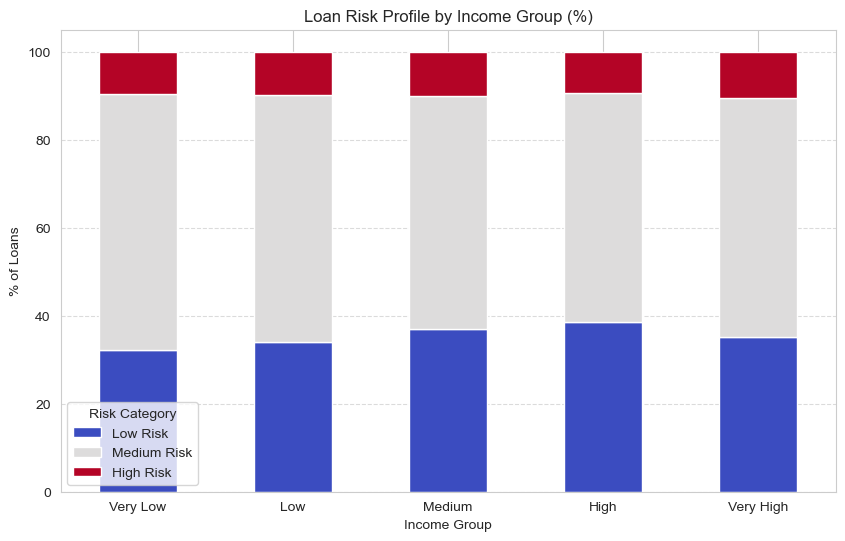

In [81]:
risk_income_crosstab = pd.crosstab(df['income_group'], df['loan_risk_category'], normalize='index') * 100

risk_income_crosstab.plot(kind='bar', stacked=True, figsize=(10,6), colormap='coolwarm')
plt.title('Loan Risk Profile by Income Group (%)')
plt.ylabel('% of Loans')
plt.xlabel('Income Group')
plt.legend(title='Risk Category')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

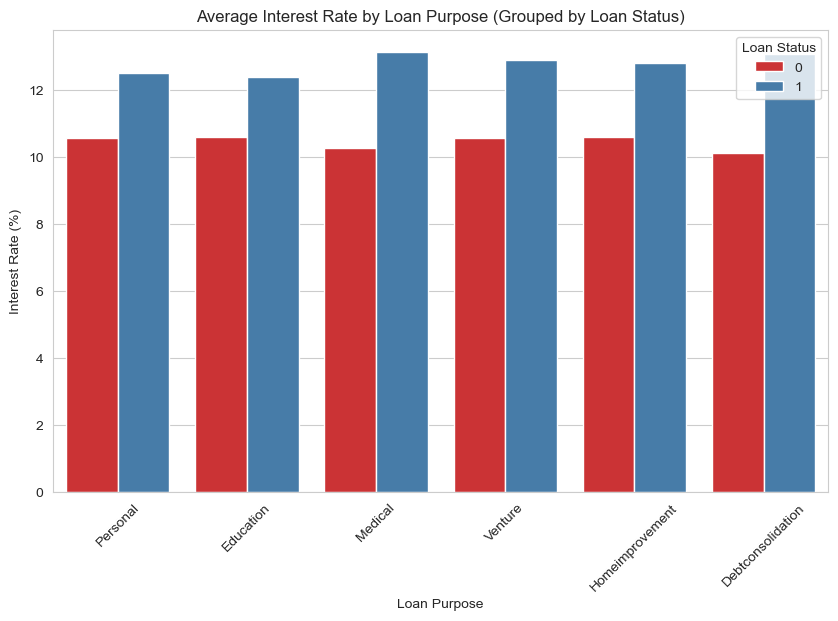

In [82]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='loan_intent', y='loan_int_rate', hue='loan_status', palette='Set1', ci=None)
plt.title('Average Interest Rate by Loan Purpose (Grouped by Loan Status)')
plt.xlabel('Loan Purpose')
plt.ylabel('Interest Rate (%)')
plt.xticks(rotation=45)
plt.legend(title='Loan Status')
plt.show()

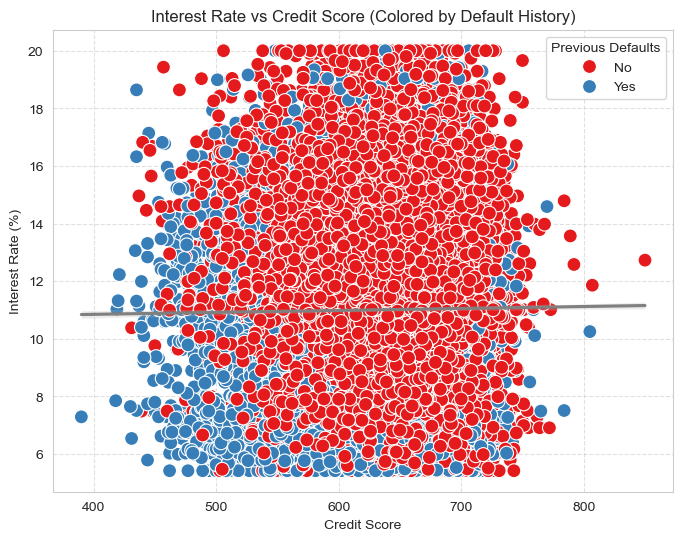

In [72]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='credit_score', y='loan_int_rate', hue='previous_loan_defaults_on_file', palette='Set1', s=100)
sns.regplot(data=df, x='credit_score', y='loan_int_rate', scatter=False, color='gray')
plt.title('Interest Rate vs Credit Score (Colored by Default History)')
plt.xlabel('Credit Score')
plt.ylabel('Interest Rate (%)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Previous Defaults')
plt.show()

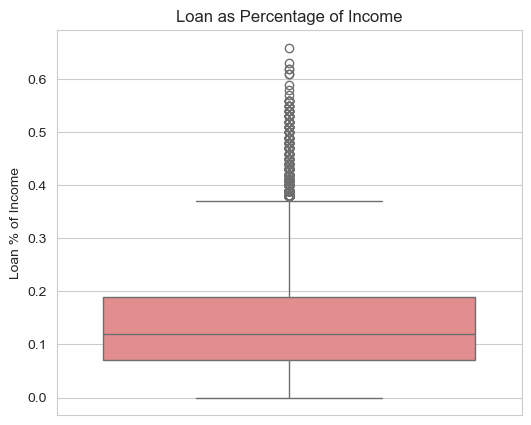

In [73]:
plt.figure(figsize=(6, 5))
sns.boxplot(data=df, y='loan_percent_income', color='lightcoral')
plt.title('Loan as Percentage of Income')
plt.ylabel('Loan % of Income')
plt.show()

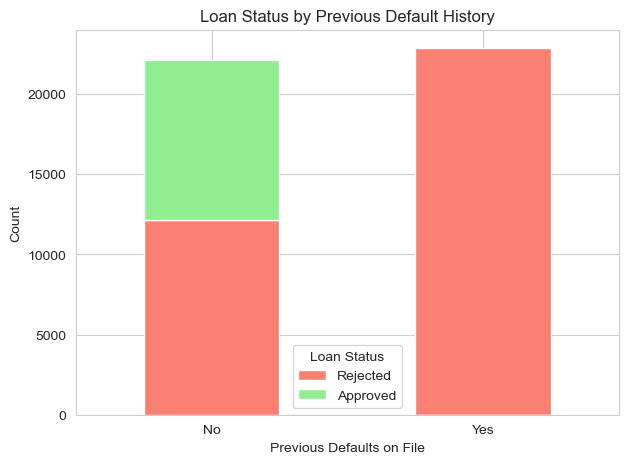

In [74]:
pd.crosstab(df['previous_loan_defaults_on_file'], df['loan_status']).plot(kind='bar', stacked=True, figsize=(7,5), color=['salmon', 'lightgreen'])
plt.title('Loan Status by Previous Default History')
plt.xlabel('Previous Defaults on File')
plt.ylabel('Count')
plt.legend(title='Loan Status', labels=['Rejected', 'Approved'])
plt.xticks(rotation=0)
plt.show()

In [75]:
import plotly.express as px

fig = px.scatter(df, 
                 x='person_income', 
                 y='loan_amnt', 
                 color='loan_status',
                 size='credit_score',
                 hover_data=['person_age', 'person_education', 'loan_intent'],
                 title='Interactive: Loan Amount vs Income (Hover for Details)')
fig.update_layout(xaxis_title='Income', yaxis_title='Loan Amount')
fig.show()

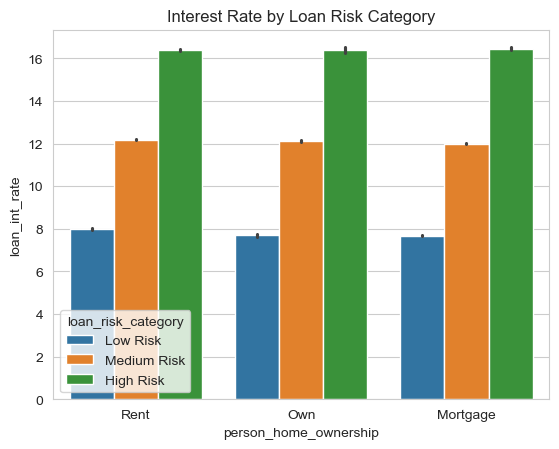

In [84]:
# stop here
sns.barplot(x='person_home_ownership', y='loan_int_rate', data=df,hue='loan_risk_category')
plt.title('Interest Rate by Loan Risk Category')
plt.show()

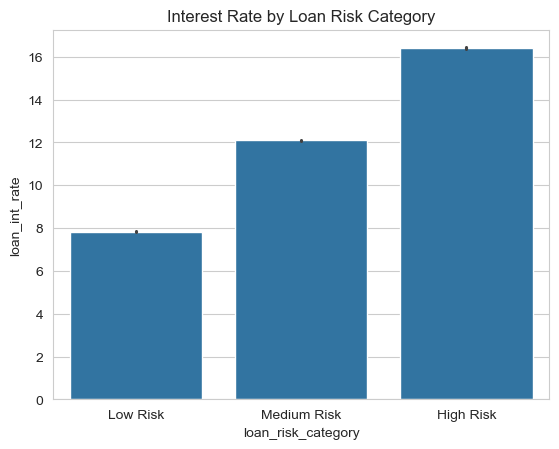

In [87]:
sns.barplot(x='loan_risk_category', y='loan_int_rate', data=df)
plt.title('Interest Rate by Loan Risk Category')
plt.show()


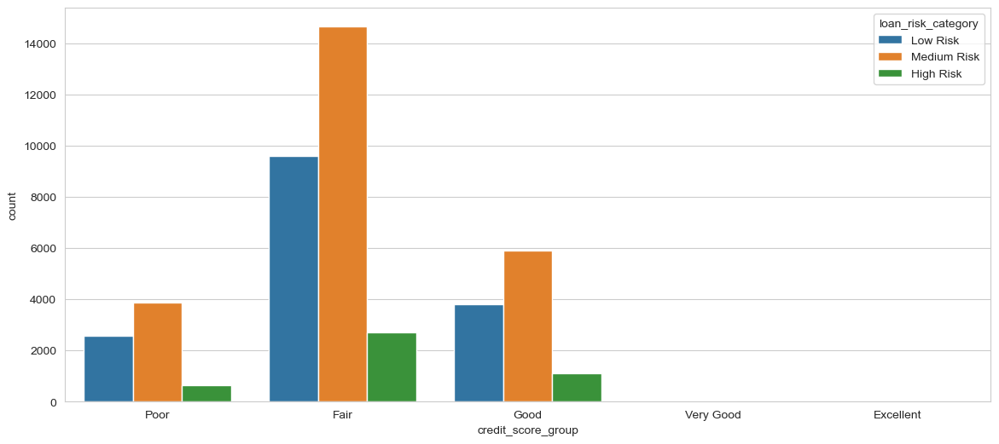

In [88]:
plt.figure(figsize=(14,6))
sns.countplot(x='credit_score_group', hue='loan_risk_category', data=df)
plt.show()

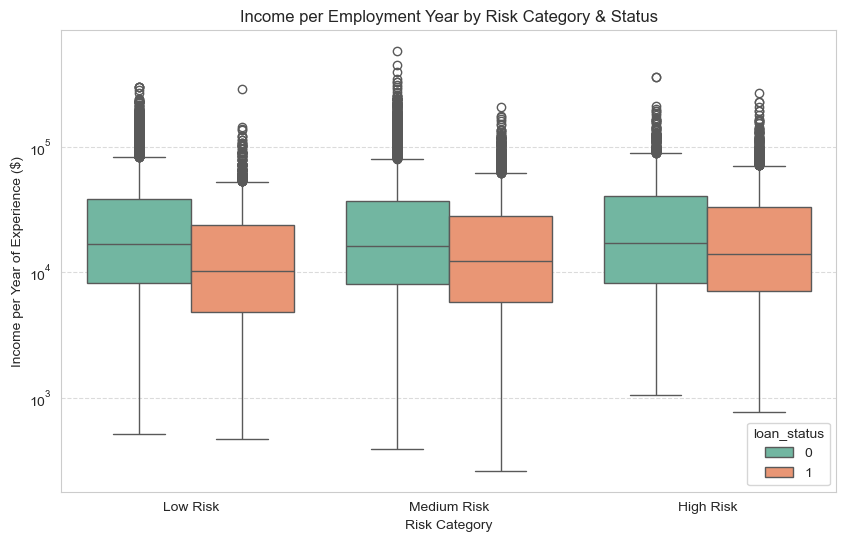

In [92]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='loan_risk_category', y='income_emp_ratio', hue='loan_status', palette='Set2')
plt.title('Income per Employment Year by Risk Category & Status')
plt.ylabel('Income per Year of Experience ($)')
plt.xlabel('Risk Category')
plt.yscale('log')  # Often skewed — log scale helps
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Stable income (high ratio) → lower risk? Higher approval? 

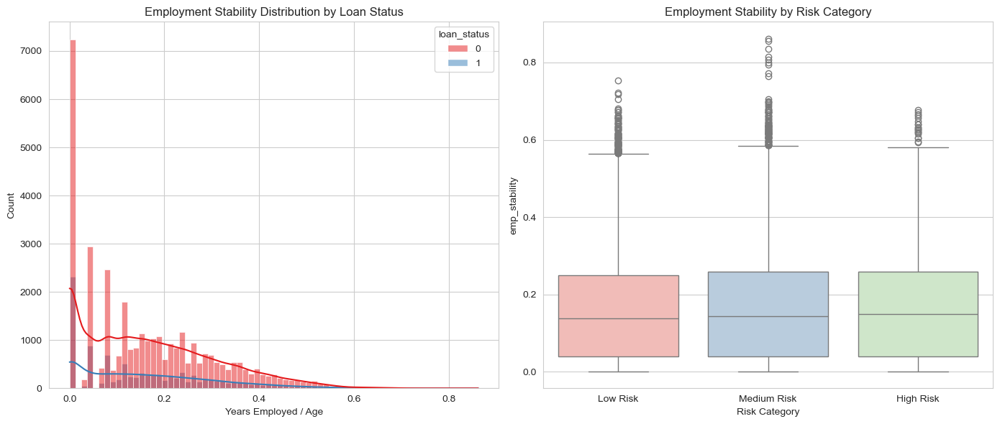

In [93]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(data=df, x='emp_stability', hue='loan_status', kde=True, ax=axes[0], palette='Set1')
axes[0].set_title('Employment Stability Distribution by Loan Status')
axes[0].set_xlabel('Years Employed / Age')

sns.boxplot(data=df, x='loan_risk_category', y='emp_stability', ax=axes[1], palette='Pastel1')
axes[1].set_title('Employment Stability by Risk Category')
axes[1].set_xlabel('Risk Category')

plt.tight_layout()
plt.show()

More stable employment → lower risk? Validate with stats later.

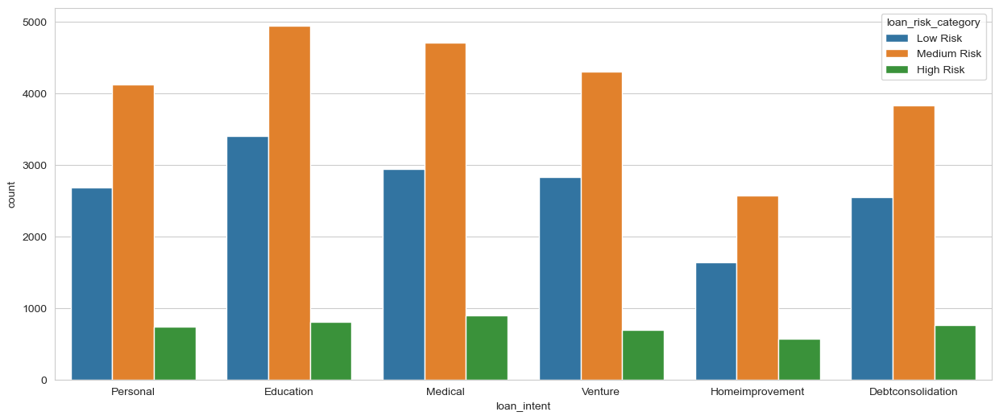

In [94]:
plt.figure(figsize=(15,6))
sns.countplot(x='loan_intent', hue='loan_risk_category', data=df)
plt.show()


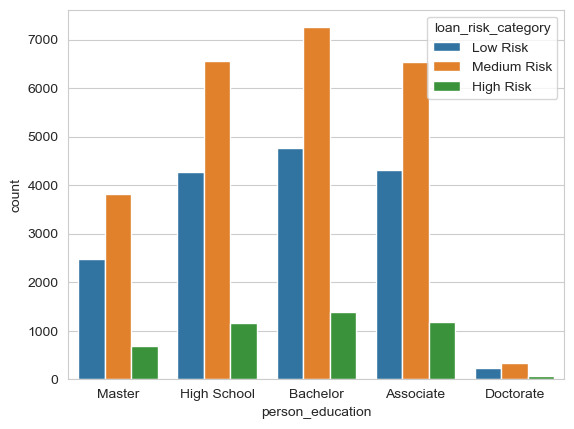

In [95]:
sns.countplot(x='person_education', hue='loan_risk_category', data=df)
plt.show()


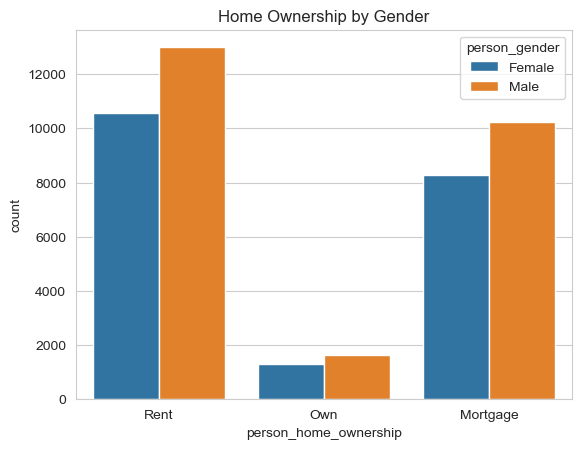

In [96]:
sns.countplot(x='person_home_ownership', hue='person_gender', data=df)
plt.title('Home Ownership by Gender')
plt.show()


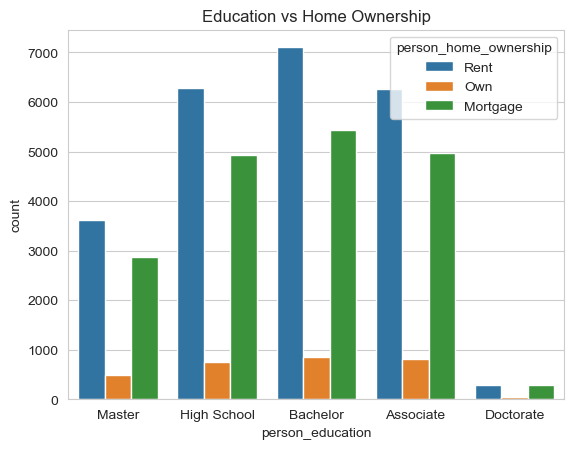

In [97]:
sns.countplot(x='person_education', hue='person_home_ownership', data=df)
plt.title('Education vs Home Ownership')
plt.show()


In [98]:
from plotly.offline import iplot

# Group mapping
edu_credit = df.groupby(['person_education', 'credit_score_group']).size().reset_index(name='count')

labels = list(set(edu_credit['person_education'])) + list(set(edu_credit['credit_score_group']))
label_dict = {label: idx for idx, label in enumerate(labels)}

source = [label_dict[row['person_education']] for _, row in edu_credit.iterrows()]
target = [label_dict[row['credit_score_group']] for _, row in edu_credit.iterrows()]
value = edu_credit['count'].tolist()

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
        color="lightblue"
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color='rgba(100, 150, 250, 0.4)'
    )
)])

fig.update_layout(title_text="Education → Credit Score Group Flow", font_size=12)
fig.show()

Shows which education levels lead to which credit tiers — useful for underwriting policy

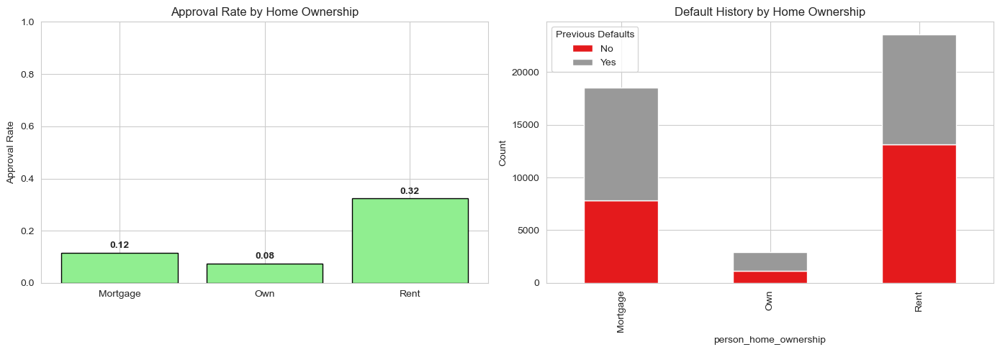

In [99]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Approval Rate
home_approval = df.groupby('person_home_ownership')['loan_status'].mean().reset_index()
bars1 = axes[0].bar(home_approval['person_home_ownership'], home_approval['loan_status'], color='lightgreen', edgecolor='black')
axes[0].set_title('Approval Rate by Home Ownership')
axes[0].set_ylabel('Approval Rate')
axes[0].set_ylim(0,1)
for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01, f'{height:.2f}', 
                 ha='center', va='bottom', fontweight='bold')

# Default History Crosstab
pd.crosstab(df['person_home_ownership'], df['previous_loan_defaults_on_file']).plot(kind='bar', stacked=True, ax=axes[1], colormap='Set1')
axes[1].set_title('Default History by Home Ownership')
axes[1].set_ylabel('Count')
axes[1].legend(title='Previous Defaults')

plt.tight_layout()
plt.show()

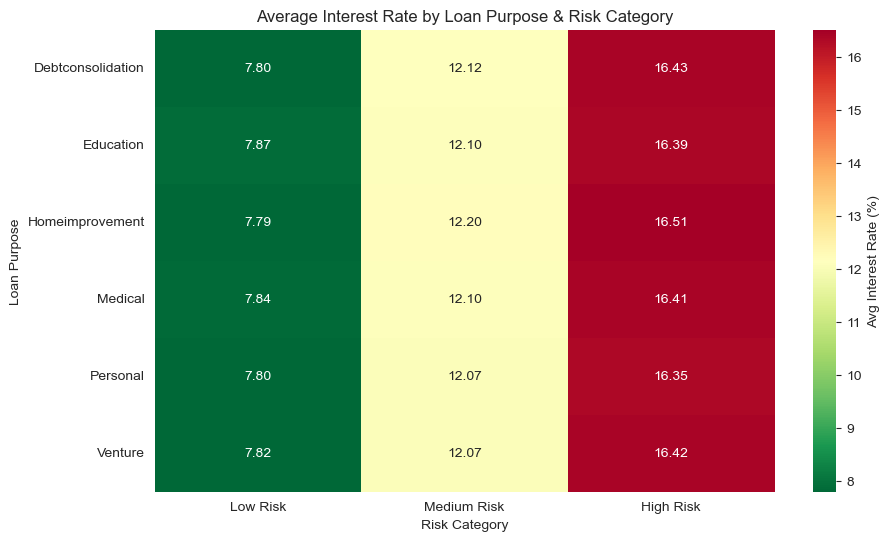

In [100]:
intent_risk = df.groupby(['loan_intent', 'loan_risk_category'])['loan_int_rate'].mean().unstack()

plt.figure(figsize=(10,6))
sns.heatmap(intent_risk, annot=True, fmt='.2f', cmap='RdYlGn_r', cbar_kws={'label': 'Avg Interest Rate (%)'})
plt.title('Average Interest Rate by Loan Purpose & Risk Category')
plt.xlabel('Risk Category')
plt.ylabel('Loan Purpose')
plt.show()

Debtconsolidation  carry higher rates if labeled high risk. when label is hight the Loan interest rate  increase 

In [101]:
fig = px.treemap(df, 
                 path=[px.Constant("All Loans"), 'loan_intent', 'loan_risk_category'], 
                 values='loan_amnt',
                 color='loan_int_rate',
                 hover_data=['credit_score', 'person_income'],
                 color_continuous_scale='RdBu',
                 title='Loan Portfolio Breakdown by Purpose & Risk (Color = Avg Interest Rate)')
fig.update_traces(textinfo="label+value")
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
fig.show()

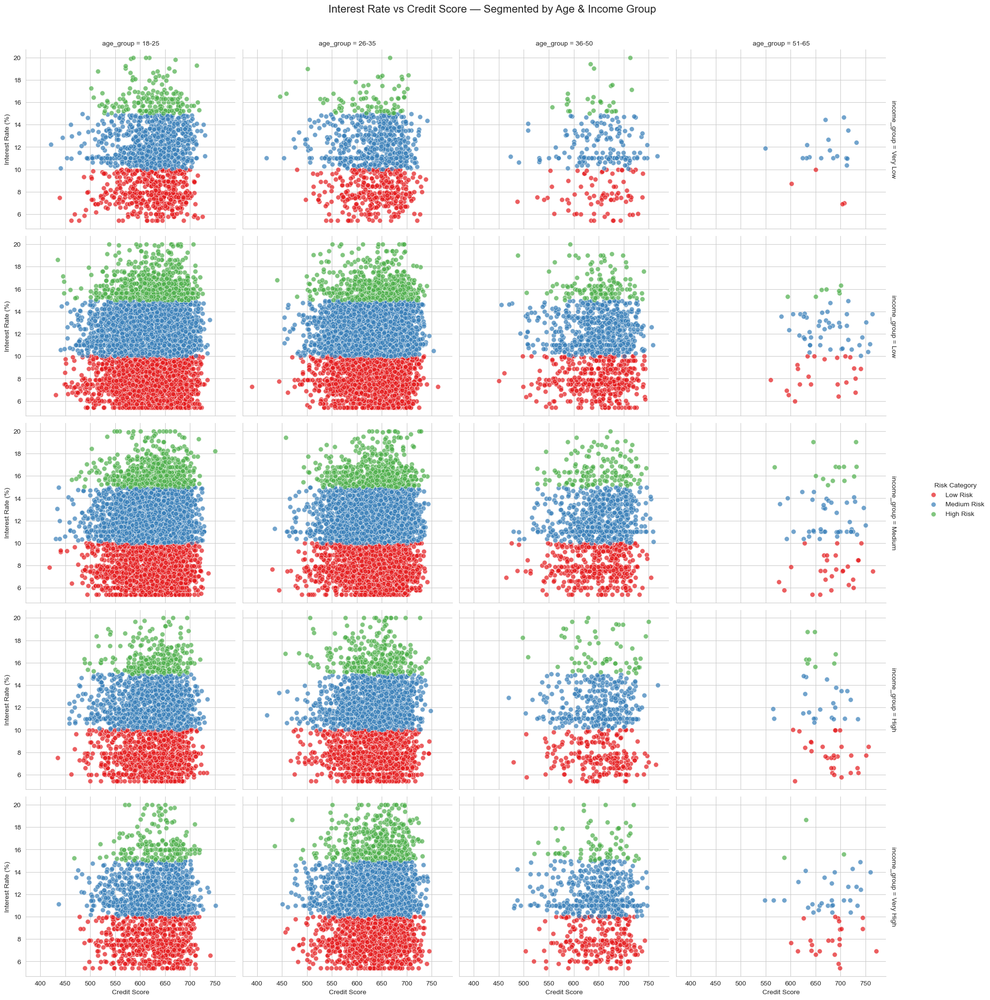

In [102]:
g = sns.FacetGrid(df, col='age_group', row='income_group', hue='loan_risk_category', 
                  height=4, aspect=1.2, palette='Set1', margin_titles=True)
g.map(sns.scatterplot, 'credit_score', 'loan_int_rate', alpha=0.7, s=50)
g.add_legend(title='Risk Category')
g.set_axis_labels('Credit Score', 'Interest Rate (%)')
g.fig.suptitle('Interest Rate vs Credit Score — Segmented by Age & Income Group', y=1.03, fontsize=16)
plt.show()

# Data Preparation for Modeling

In [106]:
# drop least important features
df.drop(columns=['person_gender','person_education','credit_score','credit_score_group'],axis=1,inplace=True)

#### Handle object data

In [110]:
cat_cols = df.select_dtypes(include=['object','category']).columns
df[cat_cols].nunique()

person_home_ownership             3
loan_intent                       6
previous_loan_defaults_on_file    2
age_group                         4
loan_risk_category                3
income_group                      5
dtype: int64

In [116]:
df['loan_risk_category'] = df['loan_risk_category'].map({'Low Risk':0,'Medium Risk':1,'High Risk':2})
df['income_group'] = df['income_group'].map({'Very Low':0,'Low':1,'Medium':2,'High':3,'Very High':4})
df['previous_loan_defaults_on_file'] = df['previous_loan_defaults_on_file'].map({'Yes':1,'No':0})

In [117]:
df=pd.get_dummies(df,columns=['person_home_ownership','loan_intent','age_group'],drop_first=True)
df = df.replace({True: 1, False: 0})

In [118]:
df.shape

(45000, 24)

In [119]:
df.head()

,person_age,person_income,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,previous_loan_defaults_on_file,loan_status,income_emp_ratio,emp_stability,...,person_home_ownership_Own,person_home_ownership_Rent,loan_intent_Education,loan_intent_Homeimprovement,loan_intent_Medical,loan_intent_Personal,loan_intent_Venture,age_group_26-35,age_group_36-50,age_group_51-65
0,22.0,71948.0,35000.0,16.02,0.49,3.0,0,1,71948.0,0.000000,...,0,1,0,0,0,1,0,0,0,0
1,21.0,12282.0,1000.0,11.14,0.08,2.0,1,0,12282.0,0.000000,...,1,0,1,0,0,0,0,0,0,0
2,25.0,12438.0,5500.0,12.87,0.44,3.0,0,1,3109.5,0.115385,...,0,0,0,0,1,0,0,0,0,0
3,23.0,79753.0,35000.0,15.23,0.44,2.0,0,1,79753.0,0.000000,...,0,1,0,0,1,0,0,0,0,0
4,24.0,66135.0,35000.0,14.27,0.53,4.0,0,1,33067.5,0.040000,...,0,1,0,0,1,0,0,0,0,0


# Split & Standardizing The Data


In [ ]:
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn.linear_model import LogisticRegression

In [72]:
x=df.drop('loan_status',axis=1)
y=df['loan_status']

In [ ]:

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)
scaler = RobustScaler()
scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)


In [74]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((36000, 22), (9000, 22), (36000,), (9000,))

# =============================================================================
# Modelling
# =============================================================================


In [79]:
###first model Logistic Regression
model = LogisticRegression()
model.fit(x_train,y_train)
y_pred=model.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print(f"acuuuracy for train model is {model.score(x_train,y_train)}")
print(f"acuuuracy for test model is {model.score(x_test,y_test)}")


Accuracy: 0.9035555555555556
F1 Score: 0.7768637532133676
acuuuracy for train model is 0.8981944444444444
acuuuracy for test model is 0.9035555555555556


In [80]:
model.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

classification report:              precision    recall  f1-score   support

           0       0.93      0.95      0.94      7000
           1       0.80      0.74      0.77      2000

    accuracy                           0.90      9000
   macro avg       0.87      0.85      0.86      9000
weighted avg       0.90      0.90      0.90      9000
 
[[6636  364]
 [ 511 1489]]


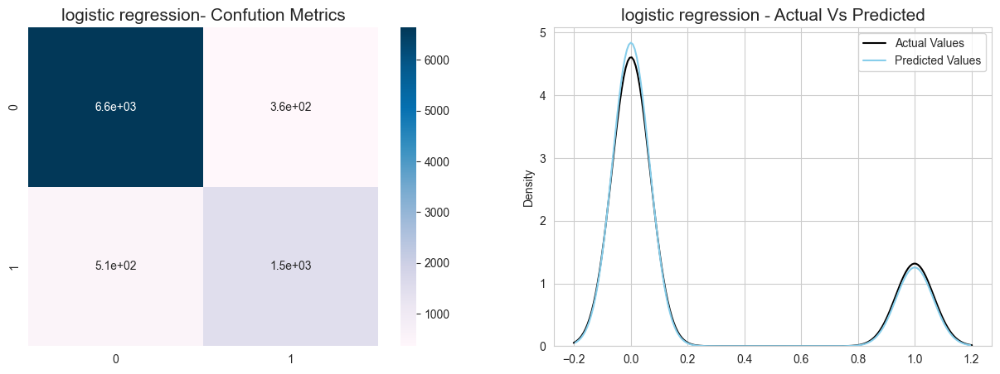

In [86]:
cals_report=classification_report(y_test,y_pred)

print(f'classification report:{cals_report} ')

cm = confusion_matrix(y_test, y_pred)
print(cm)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'logistic regression- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred, color='skyblue',label='Predicted Values')
plt.title(f'logistic regression - Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

# =============================================================================
# Handel imbalance 
# =============================================================================


with class weight

In [127]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
model5=LogisticRegression(class_weight='balanced')
model5.fit(x_train,y_train)
y_pred1=model5.predict(x_test)
accuracyModel1=accuracy_score(y_test,y_pred1)
print(f"accuracy of the model is {accuracyModel1}")

accuracy of the model is 0.8563333333333333


In [128]:
print(f"acuuuracy for train model is {model5.score(x_train,y_train)}")
print(f"acuuuracy for test model is {model5.score(x_test,y_test)}")

acuuuracy for train model is 0.8580277777777777
acuuuracy for test model is 0.8563333333333333


# =============================================================================
# Oversampling 
# =============================================================================


In [129]:
from imblearn.over_sampling import SMOTE
# Oversample Minority Class
ros = SMOTE()
X_resampled, y_resampled = ros.fit_resample(x_train, y_train)

In [130]:
X_resampled.shape

(56000, 22)

In [132]:
x_test.shape

(9000, 22)

In [202]:
model1 = LogisticRegression(C=0.001,solver='newton-cg')
model1.fit(X_resampled,y_resampled)
y_pred=model1.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print(f"acuuuracy for train model is {model1.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model1.score(x_test,y_test)}")

Accuracy: 0.852
F1 Score: 0.7315598548972189
acuuuracy for train model is 0.8784285714285714
acuuuracy for test model is 0.852


classification report:              precision    recall  f1-score   support

           0       0.97      0.84      0.90      7000
           1       0.61      0.91      0.73      2000

    accuracy                           0.85      9000
   macro avg       0.79      0.87      0.81      9000
weighted avg       0.89      0.85      0.86      9000
 
__________________________________________________

[[5853 1147]
 [ 185 1815]]


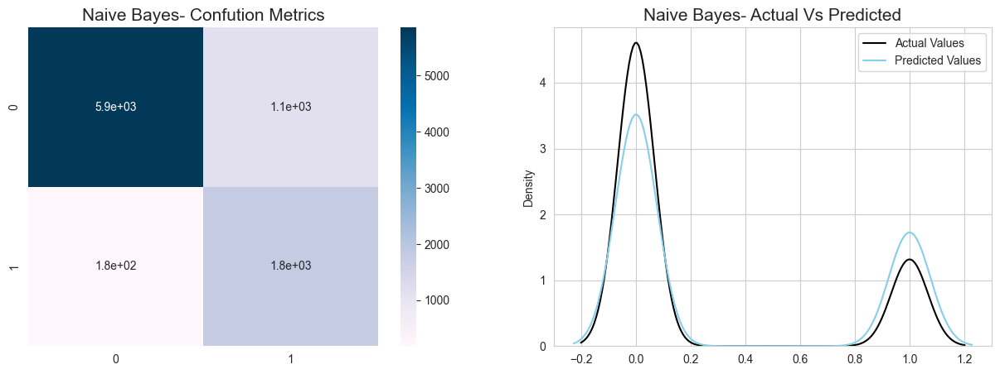

In [145]:
cals_report=classification_report(y_test,y_pred)

print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred)
print(cm)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Naive Bayes- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred, color='skyblue',label='Predicted Values')
plt.title(f'Naive Bayes- Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [ ]:
#### naive bayes
from sklearn.naive_bayes import GaussianNB
model2 = GaussianNB()
model2.fit(X_resampled,y_resampled)
y_pred2=model2.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred2))
print(f"acuuuracy for train model2 is {model2.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model2 is {model2.score(x_test,y_test)}")



Accuracy: 0.7461111111111111
acuuuracy for train model2 is 0.7408888888888889
acuuuracy for test model2 is 0.7461111111111111


classification report:              precision    recall  f1-score   support

           0       1.00      0.68      0.81      7000
           1       0.47      0.99      0.63      2000

    accuracy                           0.75      9000
   macro avg       0.73      0.83      0.72      9000
weighted avg       0.88      0.75      0.77      9000
 
__________________________________________________



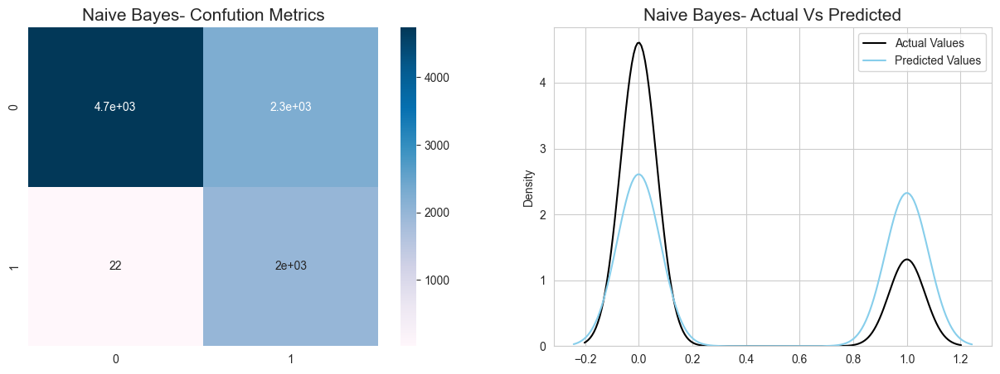

In [147]:
cals_report=classification_report(y_test,y_pred2)

print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred2)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Naive Bayes- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred2, color='skyblue',label='Predicted Values')
plt.title(f'Naive Bayes- Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [ ]:
from sklearn.naive_bayes import BernoulliNB
model3 = BernoulliNB()
model3.fit(X_resampled,y_resampled)
y_pred3=model3.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred3))
print(f"acuuuracy for train model3 is {model3.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model3 is {model3.score(x_test,y_test)}")


Accuracy: 0.8317777777777777
acuuuracy for train model3 is 0.8283888888888888
acuuuracy for test model3 is 0.8317777777777777


classification report:              precision    recall  f1-score   support

           0       0.95      0.82      0.88      7000
           1       0.58      0.86      0.69      2000

    accuracy                           0.83      9000
   macro avg       0.77      0.84      0.79      9000
weighted avg       0.87      0.83      0.84      9000
 
__________________________________________________

[[5767 1233]
 [ 281 1719]]


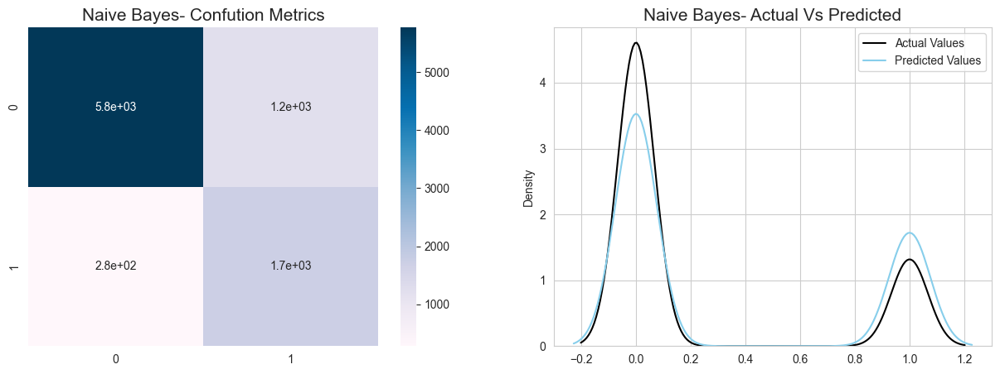

In [150]:
cals_report=classification_report(y_test,y_pred3)

print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred3)
print(cm)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Naive Bayes- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred3, color='skyblue',label='Predicted Values')
plt.title(f'Naive Bayes- Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [ ]:
from sklearn.svm import SVC
model4=SVC(kernel='rbf',C=0.01,max_iter=5000)
model4.fit(X_resampled,y_resampled)
y_pred4=model4.predict(x_test)
acc=accuracy_score(y_test,y_pred4)
print(acc)
print(f"acuuuracy for train model is {model4.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model4.score(x_test,y_test)}")

0.8806666666666667
acuuuracy for train model is 0.8815555555555555
acuuuracy for test model is 0.8806666666666667


In [169]:
from sklearn.neighbors import KNeighborsClassifier
KNN=KNeighborsClassifier(n_neighbors=3)
KNN.fit(X_resampled,y_resampled)
y_pred=KNN.predict(x_test)
print("Accurancy:",accuracy_score(y_test,y_pred))
print(f"acuuuracy for train model is {KNN.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {KNN.score(x_test,y_test)}")

Accurancy: 0.8517777777777777
acuuuracy for train model is 0.9541428571428572
acuuuracy for test model is 0.8517777777777777


#### ensamble methods 

In [ ]:
###
from sklearn.tree import DecisionTreeClassifier
model7=DecisionTreeClassifier(max_depth=5,max_features=15,criterion='entropy',min_samples_split=10)
model7.fit(X_resampled,y_resampled)
y_pred7=model7.predict(x_test)
acc=accuracy_score(y_test,y_pred7)
print(f'Accuracy Score: {acc:.2f}')
print(f"acuuuracy for train model is {model7.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model7.score(x_test,y_test)}")


Accuracy Score: 0.87
acuuuracy for train model is 0.8672857142857143
acuuuracy for test model is 0.8665555555555555


In [157]:
model7.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 4,
 'max_features': 20,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': None,
 'splitter': 'best'}

In [170]:
##random forest
from sklearn.ensemble import RandomForestClassifier
model8=RandomForestClassifier(n_estimators=100,max_depth=4,max_features=15,criterion='entropy',min_samples_split=10)
model8.fit(X_resampled,y_resampled)
y_pred8=model8.predict(x_test)
acc=accuracy_score(y_test,y_pred8)
print(f'Accuracy Score: {acc:.2f}')
print(f"acuuuracy for train model is {model8.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model8.score(x_test,y_test)}")

Accuracy Score: 0.87
acuuuracy for train model is 0.8812678571428572
acuuuracy for test model is 0.8746666666666667


Accuracy Score: 0.87
confusion matrix:
 [[6146  854]
 [ 274 1726]]
classification report:              precision    recall  f1-score   support

           0       0.96      0.88      0.92      7000
           1       0.67      0.86      0.75      2000

    accuracy                           0.87      9000
   macro avg       0.81      0.87      0.83      9000
weighted avg       0.89      0.87      0.88      9000
 
__________________________________________________



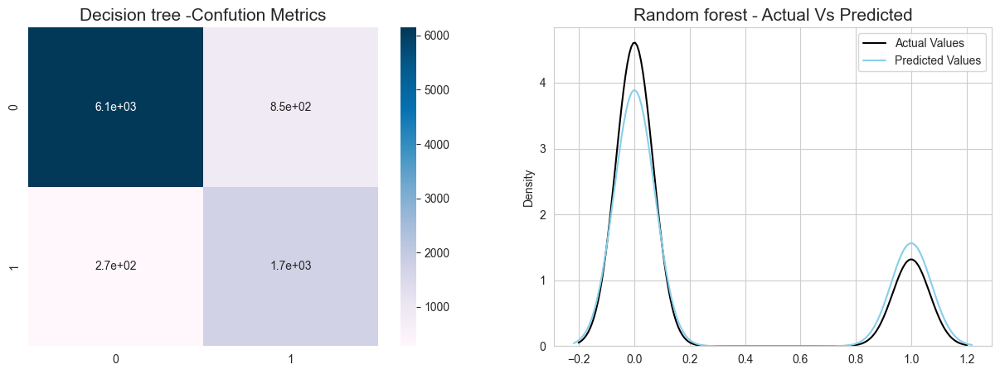

In [ ]:
cals_report=classification_report(y_test,y_pred8)
acc=accuracy_score(y_test,y_pred8)
print(f'Accuracy Score: {acc:.2f}')
print(f'confusion matrix:\n {confusion_matrix(y_test,y_pred8)}')
print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred8)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Random forest-Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred8, color='skyblue',label='Predicted Values')
plt.title(f'Random forest - Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [174]:
from xgboost import XGBClassifier
XG=XGBClassifier()
XG.fit(X_resampled,y_resampled)
y_pred9=XG.predict(x_test)
acc=accuracy_score(y_test,y_pred9)
print(f'Accuracy Score: {acc:.2f}')

Accuracy Score: 0.93


Accuracy Score: 0.93
confusion matrix:
 [[6721  279]
 [ 334 1666]]
classification report:              precision    recall  f1-score   support

           0       0.95      0.96      0.96      7000
           1       0.86      0.83      0.84      2000

    accuracy                           0.93      9000
   macro avg       0.90      0.90      0.90      9000
weighted avg       0.93      0.93      0.93      9000
 
__________________________________________________



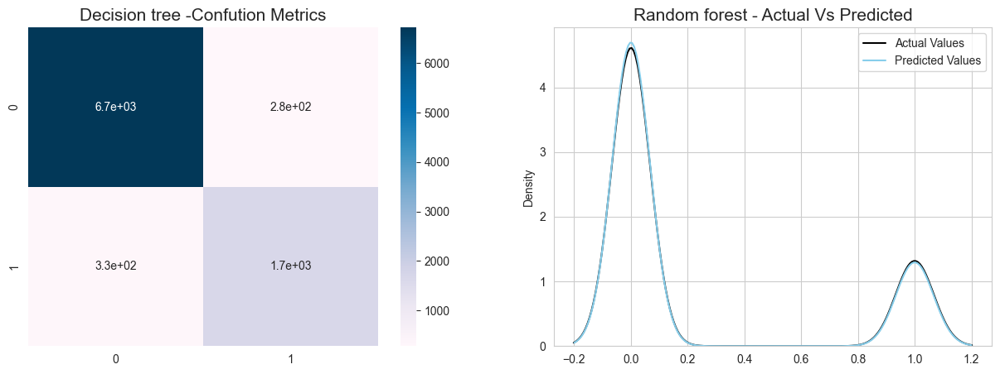

In [ ]:
cals_report=classification_report(y_test,y_pred9)
acc=accuracy_score(y_test,y_pred9)
print(f'Accuracy Score: {acc:.2f}')
print(f'confusion matrix:\n {confusion_matrix(y_test,y_pred9)}')
print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred9)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'XGBoosting -Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred9, color='skyblue',label='Predicted Values')
plt.title(f'XGBoosting - Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [180]:
X_resampled=pd.DataFrame(X_resampled,columns=x.columns)
X_resampled

x_test=pd.DataFrame(x_test,columns=x.columns)


In [181]:
from xgboost import XGBClassifier
XG=XGBClassifier()
XG.fit(X_resampled,y_resampled)
y_pred9=XG.predict(x_test)
acc=accuracy_score(y_test,y_pred9)
print(f'Accuracy Score: {acc:.2f}')

Accuracy Score: 0.93


In [188]:
importance_dict = XG.get_booster().get_score(importance_type='gain')

# Create DataFrame and sort
importance_df = pd.DataFrame({
    'Feature': list(importance_dict.keys()),
    'Importance (Gain)': list(importance_dict.values())
}).sort_values('Importance (Gain)', ascending=False)  # Sort DESC

# Show top 20
importance_df = importance_df.head(20)

In [189]:
import plotly.express as px
import plotly.graph_objects as go

# Create horizontal bar chart (best for feature names)
fig = px.bar(
    importance_df,
    x='Importance (Gain)',
    y='Feature',
    orientation='h',
    color='Importance (Gain)',
    color_continuous_scale='Blues',  # Professional blue gradient
    title='🔝 Top 20 Features Driving Loan Approval — XGBoost Model',
    height=800,
    text='Importance (Gain)'  # Show values on bars
)

# Flip y-axis so most important is on top
fig.update_layout(
    yaxis={'categoryorder':'total ascending'},  # Most important at top
    title_font_size=22,
    title_font_color='#2E86AB',
    xaxis_title="Feature Importance (Total Gain)",
    yaxis_title="Feature Name",
    template="plotly_white",
    font=dict(size=14),
    hoverlabel=dict(bgcolor="white", font_size=14, font_family="Arial")
)

# Format text on bars
fig.update_traces(
    texttemplate='%{text:.3f}',
    textposition='outside',
    marker_line_color='rgb(8,48,107)',
    marker_line_width=1.5
)

# Add grid
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')

# Show plot
fig.show()

In [190]:
from yellowbrick.classifier import ROCAUC
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier,RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
mod = []
cv_score=[]
model =[AdaBoostClassifier(), BaggingClassifier(), GradientBoostingClassifier(), ExtraTreeClassifier(), RandomForestClassifier()]
for m in model:
    cv_score.append(cross_val_score(m, X_resampled, y_resampled, scoring='accuracy', cv=5).mean())
    mod.append(m)
model_df=pd.DataFrame(columns=['model','cv_score'])
model_df['model']=mod
model_df['cv_score']=cv_score
model_df.sort_values(by=['cv_score'], ascending=True).style.background_gradient(subset=['cv_score'])


,model,cv_score
3,ExtraTreeClassifier(),0.901125
0,AdaBoostClassifier(),0.909125
2,GradientBoostingClassifier(),0.920250
1,BaggingClassifier(),0.938196
4,RandomForestClassifier(),0.948821


In [191]:
from catboost import CatBoostClassifier
model_cat=CatBoostClassifier(iterations=300,learning_rate=0.03,depth=8,eval_metric="Accuracy",verbose=50,random_state=0)
model_cat.fit(X_resampled,y_resampled)
y_pred10=model_cat.predict(x_test)
acc=accuracy_score(y_test,y_pred10)
print(f'Accuracy Score: {acc:.2f}')
# Import necessary libraries
cals_report=classification_report(y_test,y_pred10)
acc=accuracy_score(y_test,y_pred10)
print(f'Accuracy Score: {acc:.2f}')
print(f'confusion matrix:\n {confusion_matrix(y_test,y_pred10)}')

0:	learn: 0.8838571	total: 186ms	remaining: 55.5s
50:	learn: 0.9180714	total: 2.59s	remaining: 12.7s
100:	learn: 0.9301786	total: 4.6s	remaining: 9.07s
150:	learn: 0.9364464	total: 6.97s	remaining: 6.87s
200:	learn: 0.9405357	total: 9.76s	remaining: 4.81s
250:	learn: 0.9452500	total: 11.7s	remaining: 2.29s
299:	learn: 0.9484821	total: 13.8s	remaining: 0us
Accuracy Score: 0.92
Accuracy Score: 0.92
confusion matrix:
 [[6613  387]
 [ 328 1672]]


In [ ]:
from sklearn.linear_model import LogisticRegression,RidgeClassifier,SGDClassifier,PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.svm import SVC,LinearSVC,NuSVC
from sklearn.neighbors import KNeighborsClassifier,NearestCentroid
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from sklearn.ensemble import VotingClassifier
from warnings import filterwarnings


In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,precision_score,recall_score,f1_score

In [ ]:
# filterwarnings('ignore')
# models =[("LR", LogisticRegression(max_iter=1000)),('KNN',KNeighborsClassifier(n_neighbors=10)),
#          ("DTC", DecisionTreeClassifier()),("GNB", GaussianNB()),
#         ("SGDC", SGDClassifier()),("Perc", Perceptron()),("NC",NearestCentroid()),
#         ("Ridge", RidgeClassifier()),("NuSVC", NuSVC()),("BNB", BernoulliNB()),
#          ('RF',RandomForestClassifier()),('ADA',AdaBoostClassifier()),
#         ('XGB',GradientBoostingClassifier()),('PAC',PassiveAggressiveClassifier())]

# results = []
# names = []
# finalResults = []

# for name,model in models:
#     model.fit(X_resampled, y_resampled)
#     model_results = model.predict(x_test)
#     score = recall_score(y_test, model_results,average='macro')
#     results.append(score)
#     names.append(name)
#     finalResults.append((name,score))
    
# finalResults.sort(key=lambda k:k[1],reverse=True)

In [ ]:
# finalResults

[('RF', 0.8915714285714286),
 ('XGB', 0.8911071428571429),
 ('ADA', 0.8862857142857143),
 ('LR', 0.8771071428571429),
 ('NuSVC', 0.8707142857142858),
 ('SGDC', 0.8705357142857143),
 ('Ridge', 0.8662142857142857),
 ('KNN', 0.8596785714285715),
 ('DTC', 0.8585357142857143),
 ('Perc', 0.8455714285714286),
 ('BNB', 0.8416785714285715),
 ('PAC', 0.8350714285714285),
 ('GNB', 0.8328571428571429),
 ('NC', 0.8243214285714286)]

# =============================================================================
# 6. ROC CURVE COMPARISON
# =============================================================================


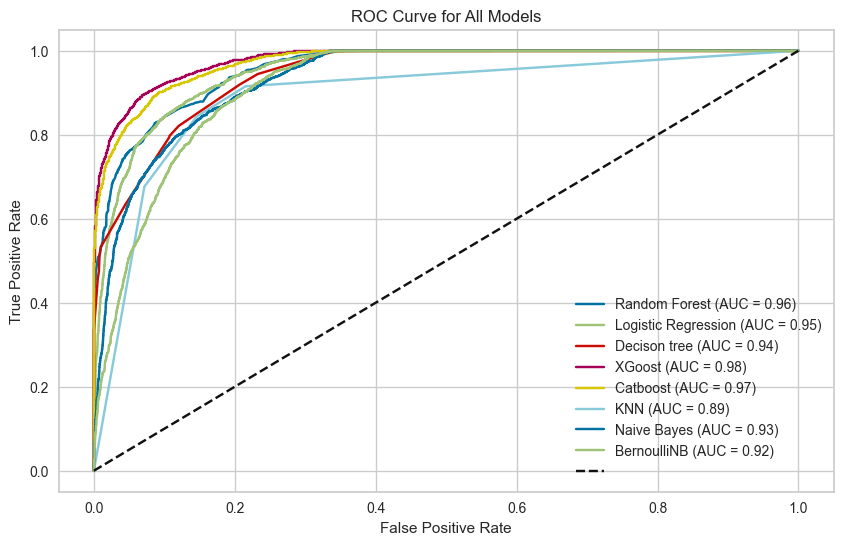

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

models = {
    "Random Forest": model8,
    "Logistic Regression": model1,
    'Decison tree':model7,
    'XGoost':XG,
    'Catboost':model_cat,
    'KNN':KNN,
    'Naive Bayes': model2,
    'BernoulliNB': model3,
    
    
}

plt.figure(figsize=(10, 6))

for name, model in models.items():
    y_probs = model.predict_proba(x_test)[:, 1]  
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', label=" ")

plt.title("ROC Curve for All Models")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

In [208]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report



#LightGBM
train_data = lgb.Dataset(x_train, label=y_train)
test_data = lgb.Dataset(x_test, label=y_test, reference=train_data)

#Focal Loss
params = {
    'objective': 'binary',          
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'learning_rate': 0.1,
    'num_leaves': 31,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': -1,
    # --- Focal Loss Parameters ---
    'focal_loss_alpha': 0.25,      
    'focal_loss_gamma': 2.0        
}

model6 = lgb.train(
    params,
    train_data,
    num_boost_round=100,
    valid_sets=[test_data],
    callbacks=[lgb.early_stopping(10)]
)

y_pred_proba = model6.predict(x_test)
y_pred = (y_pred_proba > 0.5).astype(int)

print(classification_report(y_test, y_pred))

Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.150564
              precision    recall  f1-score   support

           0       0.94      0.97      0.96      7000
           1       0.89      0.80      0.84      2000

    accuracy                           0.93      9000
   macro avg       0.92      0.89      0.90      9000
weighted avg       0.93      0.93      0.93      9000

